<a href="https://colab.research.google.com/github/JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films/blob/master/Notebook_P3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# data management
import pandas as pd    
import numpy as np
import scipy

# data viz
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set_style("darkgrid")

from plotly.offline import download_plotlyjs, plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)

import cufflinks as cf
cf.go_offline()

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

# ML algortihms
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import OneHotEncoder, StandardScaler, RobustScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import KNeighborsClassifier

In [0]:
# custom functions

from matplotlib.collections import LineCollection
import numpy as np
import pandas as pd
from scipy.cluster.hierarchy import dendrogram

def full_print(*arg, columns=20, rows=60, colwidth=50):
    """Set pandas.option_context and display a DataFrame"""
    with pd.option_context('display.max_columns', columns,
                           'display.max_rows', rows,
                           'display.max_colwidth', colwidth):
        display(*arg)

def display_circles(pca, axis_ranks=[(0, 1)], labels=None, label_rotation=0, lims=None):
    pcs = pca.components_
    n_comp = pca_popularity.n_components_
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(7,6))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(7,6))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

def plot_dendrogram(Z, names):
    plt.figure(figsize=(10,25))
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('distance')
    dendrogram(
        Z,
        labels = names,
        orientation = "left",
    )
    plt.show()

In [0]:
url = "https://github.com/JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films/raw/master/movie_metadata.csv"
df = pd.read_csv(url)

In [0]:
full_print(df.sample(5), columns=0)

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,num_voted_users,cast_total_facebook_likes,actor_3_name,facenumber_in_poster,plot_keywords,movie_imdb_link,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
1956,Color,James Bridges,28.0,107.0,21.0,418.0,Phoebe Cates,967.0,16118077.0,Drama,Dianne Wiest,"Bright Lights, Big City",5817,3067,Swoosie Kurtz,0.0,estranged wife|fashion show|magazine|new york ...,http://www.imdb.com/title/tt0094799/?ref_=fn_t...,37.0,English,USA,R,25000000.0,1988.0,767.0,5.6,1.85,377
2628,Color,Shawn Levy,69.0,88.0,189.0,799.0,Donald Faison,934.0,47811275.0,Adventure|Comedy|Family,Frankie Muniz,Big Fat Liar,29008,3707,Lee Majors,1.0,brunette|film producer|liar|prank|stunt,http://www.imdb.com/title/tt0265298/?ref_=fn_t...,99.0,English,USA,PG,15000000.0,2002.0,927.0,5.4,1.85,896
43,Color,Lee Unkrich,453.0,103.0,125.0,721.0,John Ratzenberger,15000.0,414984497.0,Adventure|Animation|Comedy|Family|Fantasy,Tom Hanks,Toy Story 3,544884,19085,Don Rickles,3.0,college|day care|escape|teddy bear|toy,http://www.imdb.com/title/tt0435761/?ref_=fn_t...,733.0,English,USA,G,200000000.0,2010.0,1000.0,8.3,1.85,30000
3657,Black and White,John Frankenheimer,64.0,133.0,287.0,28.0,Paul Scofield,343.0,NaN,Thriller|War,Jeanne Moreau,The Train,10119,502,Michel Simon,0.0,art|french|german|painting|train,http://www.imdb.com/title/tt0059825/?ref_=fn_t...,124.0,English,France,Unrated,6700000.0,1964.0,94.0,7.9,1.66,0
309,Color,Joel Schumacher,144.0,121.0,541.0,680.0,Rene Auberjonois,920.0,184031112.0,Action|Adventure|Fantasy,Michael Gough,Batman Forever,190786,2880,Debi Mazar,4.0,love|necktie|partner|rock music|tuxedo,http://www.imdb.com/title/tt0112462/?ref_=fn_t...,539.0,English,USA,PG-13,100000000.0,1995.0,710.0,5.4,1.85,0


In [0]:
full_print(df.describe([.01, .1, .25, .5, .75, .9, .99]), columns=0)

,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
count,4993.000000,5028.000000,4939.000000,5020.000000,5036.000000,4.159000e+03,5.043000e+03,5043.000000,5030.000000,5022.000000,4.551000e+03,4935.000000,5030.000000,5043.000000,4714.000000,5043.000000
mean,140.194272,107.201074,686.509212,645.009761,6560.047061,4.846841e+07,8.366816e+04,9699.063851,1.371173,272.770808,3.975262e+07,2002.470517,1651.754473,6.442138,2.220403,7525.964505
std,121.601675,25.197441,2813.328607,1665.041728,15020.759120,6.845299e+07,1.384853e+05,18163.799124,2.013576,377.982886,2.061149e+08,12.474599,4042.438863,1.125116,1.385113,19320.445110
min,1.000000,7.000000,0.000000,0.000000,0.000000,1.620000e+02,5.000000e+00,0.000000,0.000000,1.000000,2.180000e+02,1916.000000,0.000000,1.600000,1.180000,0.000000
1%,2.000000,43.000000,0.000000,0.000000,7.000000,8.497800e+03,5.426000e+01,6.420000,0.000000,1.210000,6.000000e+04,1951.340000,0.000000,3.100000,1.330000,0.000000
10%,17.200000,86.000000,0.000000,34.000000,248.500000,3.826018e+05,1.643400e+03,525.200000,0.000000,21.100000,1.400000e+06,1988.000000,79.000000,5.000000,1.850000,0.000000
25%,50.000000,93.000000,7.000000,133.000000,614.000000,5.340988e+06,8.593500e+03,1411.000000,0.000000,65.000000,6.000000e+06,1999.000000,281.000000,5.800000,1.850000,0.000000
50%,110.000000,103.000000,49.000000,371.500000,988.000000,2.551750e+07,3.435900e+04,3090.000000,1.000000,156.000000,2.000000e+07,2005.000000,595.000000,6.600000,2.350000,166.000000
75%,195.000000,118.000000,194.500000,636.000000,11000.000000,6.230944e+07,9.630900e+04,13756.500000,2.000000,326.000000,4.500000e+07,2011.000000,918.000000,7.200000,2.350000,3000.000000
90%,299.800000,134.000000,545.000000,897.000000,18500.000000,1.250252e+08,2.165620e+05,25914.400000,4.000000,630.000000,8.500000e+07,2014.000000,3000.000000,7.800000,2.350000,24000.000000


In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5043 entries, 0 to 5042
Data columns (total 28 columns):
color                        5024 non-null object
director_name                4939 non-null object
num_critic_for_reviews       4993 non-null float64
duration                     5028 non-null float64
director_facebook_likes      4939 non-null float64
actor_3_facebook_likes       5020 non-null float64
actor_2_name                 5030 non-null object
actor_1_facebook_likes       5036 non-null float64
gross                        4159 non-null float64
genres                       5043 non-null object
actor_1_name                 5036 non-null object
movie_title                  5043 non-null object
num_voted_users              5043 non-null int64
cast_total_facebook_likes    5043 non-null int64
actor_3_name                 5020 non-null object
facenumber_in_poster         5030 non-null float64
plot_keywords                4890 non-null object
movie_imdb_link              5043 non-

In [0]:
def series_to_count(series, split_character=",", ascending=False, return_dtype=None, skipna=True):
    """Return a pandas Series with each element counted after a split element-wise"""
    
    if not hasattr(series, "apply") or not hasattr(series, "name"):
        raise TypeError('Not a pandas Series')
    else:
        if split_character:
            tmp_series = series.apply(lambda s: s.split(split_character) if isinstance(s, str) else s)
        else:
            tmp_series = series.apply(lambda s: list(s) if isinstance(s, str) else s)
        count_dict = {}
        for row in tmp_series:
            if isinstance(row, list):
                for elt in row:
                    if elt in count_dict:
                        count_dict[elt] += 1
                    else:
                        count_dict[elt] = 1
            elif not skipna:
                if row in count_dict:
                    count_dict[row] += 1
                else:
                    count_dict[row] = 1
        return pd.Series(count_dict, index=sorted(count_dict, key=count_dict.get, reverse=not ascending), dtype=return_dtype, name=series.name + "_count")
      
genres = series_to_count(df.genres, "|")
plot_keywords = series_to_count(df.plot_keywords, "|")

In [0]:
genres

Drama          2594
Comedy         1872
Thriller       1411
Action         1153
Romance        1107
Adventure       923
Crime           889
Sci-Fi          616
Fantasy         610
Horror          565
Family          546
Mystery         500
Biography       293
Animation       242
Music           214
War             213
History         207
Sport           182
Musical         132
Documentary     121
Western          97
Film-Noir         6
Short             5
News              3
Reality-TV        2
Game-Show         1
Name: genres_count, dtype: int64

In [0]:
plot_keywords

love                                          198
friend                                        166
murder                                        161
death                                         132
police                                        126
new york city                                  91
high school                                    89
alien                                          82
school                                         73
boy                                            72
fbi                                            71
revenge                                        70
friendship                                     68
drugs                                          66
prison                                         62
money                                          61
marriage                                       60
island                                         57
dog                                            57
female protagonist                             57


In [0]:
(plot_keywords == 1).sum()

4908

In [0]:
shared_plot_keywords = plot_keywords[plot_keywords > 1]

In [0]:
len(shared_plot_keywords)

3178

In [0]:
keywords_to_lists = df['plot_keywords'].fillna("").str.split("|")
df['shared_plot_keywords'] = keywords_to_lists.apply(lambda lst: "|".join([elt for elt in lst if elt in shared_plot_keywords]))

In [0]:
series_to_count(df.plot_keywords, "|", skipna=False).loc[np.NaN]

153

In [0]:
df.plot_keywords.isna().sum()

153

In [0]:
df.director_name.value_counts()

Steven Spielberg         26
Woody Allen              22
Clint Eastwood           20
Martin Scorsese          20
Ridley Scott             17
Steven Soderbergh        16
Tim Burton               16
Spike Lee                16
Renny Harlin             15
Oliver Stone             14
Robert Zemeckis          13
Sam Raimi                13
Robert Rodriguez         13
Barry Levinson           13
John Carpenter           13
Joel Schumacher          13
Michael Bay              13
Ron Howard               13
Kevin Smith              12
Peter Jackson            12
Richard Donner           12
Brian De Palma           12
Tony Scott               12
Shawn Levy               12
Wes Craven               12
Stephen Frears           11
Rob Reiner               11
Francis Ford Coppola     11
Richard Linklater        11
Chris Columbus           11
                         ..
Sarah Smith               1
Sara Sugarman             1
James David Pasternak     1
Orson Welles              1
René Féret          

#### Vérification qu'il n'y a pas des "duos" de directeurs dans la base

In [0]:
series_to_count(df.director_name.str.lower(), "")

e    6295
a    5847
     5335
r    5205
n    4901
o    3902
i    3768
l    3469
s    3088
t    2764
h    2272
d    2171
c    2148
m    2125
g    1311
k    1291
b    1271
u    1196
y    1156
j     996
p     935
w     820
v     741
f     702
z     310
.     239
-      87
x      70
é      48
q      48
'      21
á      20
ó      16
ö      16
å       8
í       8
ñ       7
ç       5
ô       4
ø       3
ï       2
ä       2
û       1
æ       1
è       1
Name: director_name_count, dtype: int64

In [0]:
df.director_name.apply(lambda s: " and " in str(s)).sum()

0

In [0]:
df.director_name.apply(lambda s: " with " in str(s)).sum()

0

In [0]:
df.director_name[df.director_name.str.contains("\.", na=False)]

48                J.J. Abrams
140        M. Night Shyamalan
141               J.J. Abrams
160               J.J. Abrams
168                Jon M. Chu
179     Alejandro G. Iñárritu
197        M. Night Shyamalan
233           James L. Brooks
380                Jon M. Chu
387            Alan J. Pakula
401        Paul W.S. Anderson
430          George A. Romero
461               D.J. Caruso
506        Paul W.S. Anderson
544              F. Gary Gray
549           James L. Brooks
558        Paul W.S. Anderson
562        M. Night Shyamalan
579        M. Night Shyamalan
581        M. Night Shyamalan
595        M. Night Shyamalan
596        Paul W.S. Anderson
675            David S. Goyer
678        Paul W.S. Anderson
679        Paul W.S. Anderson
724              F. Gary Gray
745        M. Night Shyamalan
761          David O. Russell
793        Paul W.S. Anderson
824        Paul W.S. Anderson
                ...          
4445     Timothy Woodward Jr.
4457      Leslie H. Martinson
4459      

In [0]:
df.director_name[df.director_name.str.contains("-", na=False)]

244          Cedric Nicolas-Troyan
414            Jean-Jacques Annaud
555            Florent-Emilio Siri
578            Jean-Jacques Annaud
611            Jean-Jacques Annaud
627            Michael Caton-Jones
753            Michael Caton-Jones
763             Jean-Pierre Jeunet
810                 Pou-Soi Cheang
889             Jean-Pierre Jeunet
958             Jaume Collet-Serra
1013            Jaume Collet-Serra
1019                  Costa-Gavras
1176            Jean-Pierre Jeunet
1190            Sam Taylor-Johnson
1232            Jaume Collet-Serra
1285           Michael Caton-Jones
1298            Jean-Pierre Jeunet
1313              Jean-Marie Poiré
1323             Peter Ho-Sun Chan
1325                  Joon-ho Bong
1344                  Kar-Wai Wong
1451            Jaume Collet-Serra
1488              Jean-Marc Vallée
1505           Jean-Paul Rappeneau
1555            Jean-Pierre Jeunet
1564                Hyung-rae Shim
1684          Jean-François Richet
1703                

#### Analyse des variables catégorielles

In [0]:
df.color.value_counts()

Color               4815
 Black and White     209
Name: color, dtype: int64

In [0]:
df['color'] = (df['color']=='Color').astype(np.uint8)

In [0]:
df.language.value_counts()

English       4704
French          73
Spanish         40
Hindi           28
Mandarin        26
German          19
Japanese        18
Italian         11
Cantonese       11
Russian         11
Portuguese       8
Korean           8
Hebrew           5
Arabic           5
Swedish          5
Danish           5
Polish           4
Dutch            4
Norwegian        4
Persian          4
Thai             3
Chinese          3
None             2
Icelandic        2
Zulu             2
Dari             2
Romanian         2
Indonesian       2
Aboriginal       2
Slovenian        1
Swahili          1
Aramaic          1
Filipino         1
Hungarian        1
Panjabi          1
Telugu           1
Maya             1
Tamil            1
Bosnian          1
Czech            1
Mongolian        1
Kazakh           1
Vietnamese       1
Kannada          1
Urdu             1
Dzongkha         1
Greek            1
Name: language, dtype: int64

In [0]:
df.country.value_counts()

USA                     3807
UK                       448
France                   154
Canada                   126
Germany                   97
Australia                 55
India                     34
Spain                     33
China                     30
Japan                     23
Italy                     23
Hong Kong                 17
Mexico                    17
New Zealand               15
South Korea               14
Ireland                   12
Russia                    11
Denmark                   11
Brazil                     8
South Africa               8
Norway                     8
Sweden                     6
Netherlands                5
Thailand                   5
Poland                     5
Israel                     4
Iran                       4
Romania                    4
Argentina                  4
Belgium                    4
                        ... 
Taiwan                     2
Greece                     2
Official site              1
Colombia      

#### Analyse et transformation des content_ratings

In [0]:
df.content_rating.value_counts()

R            2118
PG-13        1461
PG            701
Not Rated     116
G             112
Unrated        62
Approved       55
TV-14          30
TV-MA          20
TV-PG          13
X              13
TV-G           10
Passed          9
NC-17           7
GP              6
M               5
TV-Y7           1
TV-Y            1
Name: content_rating, dtype: int64

In [0]:
full_print(df[df.content_rating=="TV-14"], columns=0)

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,num_voted_users,cast_total_facebook_likes,actor_3_name,facenumber_in_poster,plot_keywords,movie_imdb_link,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,shared_plot_keywords
177,1,NaN,21.0,60.0,NaN,184.0,Philip Michael Thomas,982.0,NaN,Action|Crime|Drama|Mystery|Thriller,Don Johnson,Miami Vice,16769,1687,John Diehl,2.0,cult tv|detective|drugs|police|undercover,http://www.imdb.com/title/tt0086759/?ref_=fn_t...,74.0,English,USA,TV-14,1500000.0,NaN,321.0,7.5,1.33,0,cult tv|detective|drugs|police|undercover
404,1,NaN,103.0,44.0,NaN,148.0,Scott Thompson,544.0,NaN,Crime|Drama|Horror|Mystery|Thriller,Caroline Dhavernas,Hannibal,159910,996,Hettienne Park,1.0,blood|cannibalism|fbi|manipulation|psychiatrist,http://www.imdb.com/title/tt2243973/?ref_=fn_t...,270.0,English,USA,TV-14,NaN,NaN,183.0,8.6,1.78,59000,blood|cannibalism|fbi|manipulation|psychiatrist
537,1,NaN,12.0,43.0,NaN,218.0,Matt Ryan,1000.0,NaN,Drama|Fantasy|Horror|Thriller,Harold Perrineau,Constantine,36919,1990,Charles Halford,1.0,based on comic|based on comic book|dc arrowver...,http://www.imdb.com/title/tt3489184/?ref_=fn_t...,94.0,English,USA,TV-14,NaN,NaN,560.0,7.5,16.00,10000,based on comic|based on comic book|dc comics|s...
593,1,NaN,39.0,45.0,NaN,160.0,Katia Winter,898.0,NaN,Adventure|Drama|Fantasy|Mystery|Thriller,Nicole Beharie,Sleepy Hollow,49049,1430,Lyndie Greenwood,0.0,apocalypse|death|husband wife relationship|mot...,http://www.imdb.com/title/tt2647544/?ref_=fn_t...,110.0,English,USA,TV-14,NaN,NaN,372.0,7.5,16.00,14000,apocalypse|death|husband wife relationship|mot...
821,1,Frank Coraci,53.0,119.0,153.0,11000.0,Adam Sandler,12000.0,NaN,Comedy|Western,Taylor Lautner,The Ridiculous 6,27019,36167,Jon Lovitz,4.0,apache|bank robbery|baseball|half brothers|whi...,http://www.imdb.com/title/tt2479478/?ref_=fn_t...,143.0,English,USA,TV-14,NaN,2015.0,11000.0,4.9,2.35,0,apache|bank robbery|baseball
857,1,NaN,77.0,44.0,NaN,72.0,Don S. Davis,847.0,NaN,Action|Adventure|Drama|Sci-Fi,Christopher Judge,Stargate SG-1,63982,1359,Gary Jones,4.0,2000s|21st century|alternate history|message f...,http://www.imdb.com/title/tt0118480/?ref_=fn_t...,181.0,English,USA,TV-14,1400000.0,NaN,440.0,8.4,1.33,0,2000s|21st century|alternate history|message f...
1404,1,NaN,5.0,43.0,NaN,452.0,Aimee Garcia,778.0,NaN,Action|Comedy|Crime,Jon Foo,Rush Hour,2185,2255,Wendie Malick,2.0,NaN,http://www.imdb.com/title/tt4085584/?ref_=fn_t...,30.0,English,USA,TV-14,NaN,NaN,618.0,5.8,16.00,0,
1620,1,NaN,51.0,44.0,NaN,690.0,Aimee Teegarden,971.0,NaN,Drama|Sport,Zach Gilford,Friday Night Lights,42746,3418,Scott Porter,1.0,football|football coach|high school|small town...,http://www.imdb.com/title/tt0758745/?ref_=fn_t...,257.0,English,USA,TV-14,NaN,NaN,741.0,8.7,1.78,0,football|football coach|high school|small town...
1736,1,NaN,13.0,42.0,NaN,442.0,Kirk Acevedo,757.0,NaN,Adventure|Drama|Mystery|Sci-Fi|Thriller,Amanda Schull,12 Monkeys,20839,3309,Tom Noonan,0.0,epidemic|mission|paradox|plague|virus,http://www.imdb.com/title/tt3148266/?ref_=fn_t...,56.0,English,USA,TV-14,NaN,NaN,641.0,7.6,16.00,12000,epidemic|mission|plague|virus
1802,1,NaN,7.0,42.0,NaN,535.0,Mary Elizabeth Mastrantonio,766.0,NaN,Crime|Drama|Sci-Fi|Thriller,Colin Salmon,Limitless,38177,2707,Jake McDorman,2.0,brain capacity|fbi|fictional drug|intelligence...,http://www.imdb.com/title/tt4422836/?ref_=fn_t...,131.0,English,USA,TV-14,NaN,NaN,638.0,7.9,16.00,11000,brain capacity|fbi|fictional drug|intelligence


#### Content_rating vers 3 variables binaires et remplissage des valeurs manquantes

In [0]:
# https://en.wikipedia.org/wiki/Motion_Picture_Association_of_America_film_rating_system
# [suitable for children, suitable for teenargers (below 18), was shown in theaters (or on TV)]
ratings = {
    "PG-13": [0, 1, 1],
    "PG": [1, 1, 1],
    "G": [1, 1, 1],
    "R": [0, 0, 1],
    "TV-14": [0, 1, 0],
    "TV-PG": [0, 1, 0],
    "TV-MA": [0, 0, 0],
    "TV-G": [1, 1, 0],
    "TV-Y": [1, 1, 0],
    "NC-17": [0, 0, 1],
    "X": [0, 0, 1],
    "TV-Y7": [1, 1, 0],
    "GP": [1, 1, 1],
    "M": [1, 1, 1],
    np.NaN: [np.NaN, np.NaN, np.NaN]
}

ratings_to_be_filled = [
    "Not Rated",
    "Unrated",
    "Approved",
    "Passed",
]

In [0]:
df_genre_rating = df[['director_name', 'genres', 'content_rating']]
df_genre_rating['content_rating'] = df_genre_rating['content_rating'].replace(ratings_to_be_filled)
print(df_genre_rating['content_rating'].unique())
print(df['content_rating'].unique())

['PG-13' nan 'PG' 'G' 'R' 'TV-14' 'TV-PG' 'TV-MA' 'TV-G' 'TV-Y' 'NC-17'
 'X' 'TV-Y7' 'GP' 'M']
['PG-13' nan 'PG' 'G' 'R' 'TV-14' 'TV-PG' 'TV-MA' 'TV-G' 'Not Rated'
 'Unrated' 'Approved' 'TV-Y' 'NC-17' 'X' 'TV-Y7' 'GP' 'Passed' 'M']


In [0]:
df_genre_rating[[
    'suitable_for_children',
    'suitable_for_young_teenagers',
    'shown_in_theaters'
]] = pd.DataFrame(
    df_genre_rating.content_rating.apply(lambda s: pd.Series({
        'suitable_for_children': ratings[s][0],
        'suitable_for_young_teenagers': ratings[s][1],
        'shown_in_theaters': ratings[s][2]}))
    , index=df.index
)
df_genre_rating.sample(10)

,director_name,genres,content_rating,suitable_for_children,suitable_for_young_teenagers,shown_in_theaters
2486,James Cameron,Action|Adventure|Sci-Fi,R,0.0,0.0,1.0
4074,Michael Schultz,Comedy|Drama|Music,R,0.0,0.0,1.0
3399,Mike Leigh,Comedy|Drama,PG-13,0.0,1.0,1.0
2955,Franklin J. Schaffner,Drama|Thriller,R,0.0,0.0,1.0
3384,Miguel Arteta,Drama|Romance,R,0.0,0.0,1.0
4647,James Algar,Animation|Drama|Family,R,0.0,0.0,1.0
225,Paul Greengrass,Action|Thriller,PG-13,0.0,1.0,1.0
4366,Morgan Spurlock,Comedy|Documentary,PG-13,0.0,1.0,1.0
3054,Simon Curtis,Biography|Drama|History,PG-13,0.0,1.0,1.0
1931,Shekhar Kapur,Biography|Drama|History,R,0.0,0.0,1.0


In [0]:
countvect = CountVectorizer()
X = countvect.fit_transform(df_genre_rating.dropna(subset=['genres', 'content_rating']).genres.str.replace(" ", "").str.replace("-", ""))
y = df_genre_rating.dropna(subset=['genres', 'content_rating'])[['suitable_for_children', 'suitable_for_young_teenagers', 'shown_in_theaters']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

clf = RandomForestClassifier(100)
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)

print(classification_report(y_test, y_predict))
print(classification_report(y_test, y_predict))
print(confusion_matrix(y_test.values[:,0], y_predict[:,0]))
print(confusion_matrix(y_test.values[:,1], y_predict[:,1]))
print(confusion_matrix(y_test.values[:,2], y_predict[:,2]))

              precision    recall  f1-score   support

           0       0.90      0.59      0.71       179
           1       0.69      0.65      0.67       482
           2       0.98      1.00      0.99       922

   micro avg       0.89      0.85      0.87      1583
   macro avg       0.86      0.74      0.79      1583
weighted avg       0.88      0.85      0.86      1583
 samples avg       0.91      0.88      0.86      1583

              precision    recall  f1-score   support

           0       0.90      0.59      0.71       179
           1       0.69      0.65      0.67       482
           2       0.98      1.00      0.99       922

   micro avg       0.89      0.85      0.87      1583
   macro avg       0.86      0.74      0.79      1583
weighted avg       0.88      0.85      0.86      1583
 samples avg       0.91      0.88      0.86      1583

[[750  12]
 [ 74 105]]
[[319 140]
 [170 312]]
[[  0  19]
 [  1 921]]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1145: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1145: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels.



In [0]:
tfidf = TfidfVectorizer()
X = tfidf.fit_transform(df_genre_rating.dropna(subset=['genres', 'content_rating']).genres.str.replace(" ", "").str.replace("-", ""))
y = df_genre_rating.dropna(subset=['genres', 'content_rating'])[['suitable_for_children', 'suitable_for_young_teenagers', 'shown_in_theaters']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

clf = RandomForestClassifier(20)
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)

print(classification_report(y_test, y_predict))
print(confusion_matrix(y_test.values[:,0], y_predict[:,0]))
print(confusion_matrix(y_test.values[:,1], y_predict[:,1]))
print(confusion_matrix(y_test.values[:,2], y_predict[:,2]))

              precision    recall  f1-score   support

           0       0.85      0.64      0.73       165
           1       0.71      0.66      0.68       466
           2       0.99      1.00      1.00       910

   micro avg       0.90      0.86      0.88      1541
   macro avg       0.85      0.77      0.80      1541
weighted avg       0.89      0.86      0.87      1541
 samples avg       0.92      0.89      0.88      1541

[[732  19]
 [ 59 106]]
[[324 126]
 [159 307]]
[[  0   6]
 [  1 909]]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1145: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels.
  'recall', 'true', average, warn_for)


In [0]:
enc = OneHotEncoder(handle_unknown='ignore')
X_director = enc.fit_transform(df_genre_rating.dropna(subset=['genres', 'content_rating']).director_name.fillna("").values.reshape(-1, 1))

tfidf = TfidfVectorizer()
X_genre = tfidf.fit_transform(df_genre_rating.dropna(subset=['genres', 'content_rating']).genres.str.replace(" ", "").str.replace("-", ""))

X = scipy.sparse.hstack((X_director, X_genre))
y = df_genre_rating.dropna(subset=['genres', 'content_rating'])[['suitable_for_children', 'suitable_for_young_teenagers', 'shown_in_theaters']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

clf = RandomForestClassifier(100)
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)

print(classification_report(y_test, y_predict))
print(confusion_matrix(y_test.values[:,0], y_predict[:,0]))
print(confusion_matrix(y_test.values[:,1], y_predict[:,1]))
print(confusion_matrix(y_test.values[:,2], y_predict[:,2]))

              precision    recall  f1-score   support

           0       0.87      0.58      0.69       179
           1       0.72      0.64      0.68       482
           2       1.00      1.00      1.00       922

   micro avg       0.91      0.84      0.87      1583
   macro avg       0.86      0.74      0.79      1583
weighted avg       0.90      0.84      0.87      1583
 samples avg       0.92      0.88      0.87      1583

[[747  15]
 [ 76 103]]
[[340 119]
 [175 307]]
[[ 15   4]
 [  0 922]]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1145: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels.
  'recall', 'true', average, warn_for)


In [0]:
enc = OneHotEncoder(handle_unknown='ignore')
X_director = enc.fit_transform(df_genre_rating.dropna(subset=['genres', 'content_rating']).fillna("").director_name.values.reshape(-1, 1))

tfidf = TfidfVectorizer()
X_genre = tfidf.fit_transform(df_genre_rating.dropna(subset=['genres', 'content_rating']).genres.str.replace(" ", "").str.replace("-", ""))

X = scipy.sparse.hstack((X_director, X_genre))
y = df_genre_rating.dropna(subset=['genres', 'content_rating'])[['suitable_for_children', 'suitable_for_young_teenagers', 'shown_in_theaters']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

log_reg = {}
for col in ['suitable_for_children', 'suitable_for_young_teenagers', 'shown_in_theaters']:
    #cv = cross_val_score(LogisticRegression(), X, y.values[:, col], n_jobs=-1)
    log_reg[col] = LogisticRegressionCV(n_jobs=10).fit(X, y[col])
    print(log_reg[col].score(X, y[col]))

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:2053: FutureWarning:

You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.



0.9309245483528161


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:2053: FutureWarning:

You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.



0.7734325185972369


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:2053: FutureWarning:

You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.



0.9968119022316685


In [0]:
fill_index = df_genre_rating[(~df_genre_rating.genres.isna() & df_genre_rating.content_rating.isna())].index

y_fill_predict = {}
X_fill = scipy.sparse.hstack((
    enc.transform(df_genre_rating.loc[fill_index, 'director_name'].fillna("").values.reshape(-1, 1)),
    tfidf.transform(df_genre_rating.loc[fill_index, 'genres'].str.replace(" ", "").str.replace("-", ""))
))

for col in ['suitable_for_children', 'suitable_for_young_teenagers', 'shown_in_theaters']:
    y_fill_predict[col] = log_reg[col].predict(X_fill)
    print(y_fill_predict[col].shape)

(338,)
(338,)
(338,)


In [0]:
for col in ['suitable_for_children', 'suitable_for_young_teenagers', 'shown_in_theaters']:
    df_genre_rating.loc[fill_index, col] = y_fill_predict[col]

In [0]:
df[['suitable_for_children', 'suitable_for_young_teenagers', 'shown_in_theaters']] = df_genre_rating[['suitable_for_children', 'suitable_for_young_teenagers', 'shown_in_theaters']]

In [0]:
df.columns

Index(['color', 'director_name', 'num_critic_for_reviews', 'duration',
       'director_facebook_likes', 'actor_3_facebook_likes', 'actor_2_name',
       'actor_1_facebook_likes', 'gross', 'genres', 'actor_1_name',
       'movie_title', 'num_voted_users', 'cast_total_facebook_likes',
       'actor_3_name', 'facenumber_in_poster', 'plot_keywords',
       'movie_imdb_link', 'num_user_for_reviews', 'language', 'country',
       'content_rating', 'budget', 'title_year', 'actor_2_facebook_likes',
       'imdb_score', 'aspect_ratio', 'movie_facebook_likes',
       'shared_plot_keywords', 'suitable_for_children',
       'suitable_for_young_teenagers', 'shown_in_theaters'],
      dtype='object')

#### Analyse des budgets et recettes

In [0]:
average_roi = (df.dropna(subset=['budget', 'gross']).gross.sum() - df.dropna(subset=['budget', 'gross']).budget.sum()) / df.dropna(subset=['budget', 'gross']).budget.sum()
average_roi

0.12927850009698813

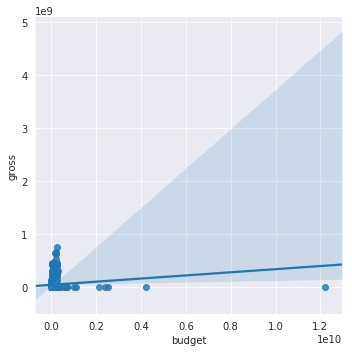

In [0]:
sns.lmplot('budget', 'gross', df.dropna(subset=['budget', 'gross']))

In [0]:
full_print(df.loc[df.budget.idxmax()])

color                                                                           1
director_name                                                        Joon-ho Bong
num_critic_for_reviews                                                        363
duration                                                                      110
director_facebook_likes                                                       584
actor_3_facebook_likes                                                         74
actor_2_name                                                         Kang-ho Song
actor_1_facebook_likes                                                        629
gross                                                                 2.20141e+06
genres                                                 Comedy|Drama|Horror|Sci-Fi
actor_1_name                                                            Doona Bae
movie_title                                                             The Host 
num_voted_users 

Le budget est en won (sud-corréens) et les recettes en dollar. Problème : 1 won = 0,00084$

In [0]:
average_roi = (df[df['country']=='USA'].dropna(subset=['budget', 'gross']).gross.sum() - df[df['country']=='USA'].dropna(subset=['budget', 'gross']).budget.sum()) / df[df['country']=='USA'].dropna(subset=['budget', 'gross']).budget.sum()
average_roi

0.4311193031231128

In [0]:
full_print(df[(df['country']=='France') & (df['title_year']<2002)], columns=0)

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,num_voted_users,cast_total_facebook_likes,actor_3_name,facenumber_in_poster,plot_keywords,movie_imdb_link,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,shared_plot_keywords,suitable_for_children,suitable_for_young_teenagers,shown_in_theaters
332,1,Luc Besson,173.0,126.0,0.0,10000.0,Bruce Willis,14000.0,63540020.0,Action|Adventure|Sci-Fi,Milla Jovovich,The Fifth Element,343274,39319,Gary Oldman,2.0,1910s|alien|artificially created woman|love|ta...,http://www.imdb.com/title/tt0119116/?ref_=fn_t...,742.0,English,France,PG-13,93000000.0,1997.0,13000.0,7.7,2.35,18000,1910s|alien|love|taxi driver,0.0,1.0,1.0
677,1,Mike Nichols,117.0,143.0,0.0,210.0,Adrian Lester,509.0,38966057.0,Comedy|Drama,Maura Tierney,Primary Colors,23940,1409,Paul Guilfoyle,0.0,campaigning|candidate|election|governor|president,http://www.imdb.com/title/tt0119942/?ref_=fn_t...,157.0,English,France,R,65000000.0,1998.0,317.0,6.7,2.35,688,campaigning|election|governor|president,0.0,0.0,1.0
687,1,Nora Ephron,60.0,105.0,0.0,506.0,Michael Moore,975.0,10014234.0,Comedy|Crime,Michael Rapaport,Lucky Numbers,8560,3580,Richard Schiff,1.0,celebrity|lottery|murder|snowmobile|weatherman,http://www.imdb.com/title/tt0219952/?ref_=fn_t...,69.0,English,France,R,65000000.0,2000.0,909.0,5.0,1.85,177,celebrity|lottery|murder|snowmobile|weatherman,0.0,0.0,1.0
702,1,Jonathan Mostow,178.0,116.0,84.0,563.0,Thomas Kretschmann,11000.0,77086030.0,Action|War,Matthew McConaughey,U-571,65297,14931,David Keith,0.0,battle|historically inaccurate|submarine movie...,http://www.imdb.com/title/tt0141926/?ref_=fn_t...,602.0,English,France,PG-13,62000000.0,2000.0,919.0,6.6,2.35,0,battle|historically inaccurate|submarine movie...,0.0,1.0,1.0
999,0,Richard Donner,61.0,132.0,503.0,282.0,Sylvester Stallone,45000.0,30306268.0,Action|Crime|Thriller,Muse Watson,Assassins,62981,58528,Kelly Rowan,0.0,assassin|floppy disk|modem|rival|russian,http://www.imdb.com/title/tt0112401/?ref_=fn_t...,84.0,English,France,R,50000000.0,1995.0,13000.0,6.3,1.85,0,assassin|floppy disk|rival|russian,0.0,0.0,1.0
1016,1,Luc Besson,111.0,158.0,0.0,15.0,David Bailie,51.0,14131298.0,Adventure|Biography|Drama|History|War,Paul Brooke,The Messenger: The Story of Joan of Arc,55889,144,Rab Affleck,0.0,cathedral|dauphin|france|trial|wartime rape,http://www.imdb.com/title/tt0151137/?ref_=fn_t...,390.0,English,France,R,390000000.0,1999.0,40.0,6.4,2.35,0,cathedral|france|trial,0.0,0.0,1.0
1217,0,Oliver Stone,125.0,206.0,0.0,4.0,Jay O. Sanders,433.0,70405498.0,Drama|History|Thriller,Sally Kirkland,JFK,113472,698,Cheryl Penland,1.0,death|gay slur|homosexuality|investigation|pre...,http://www.imdb.com/title/tt0102138/?ref_=fn_t...,442.0,English,France,R,40000000.0,1991.0,256.0,8.0,2.35,0,death|gay slur|homosexuality|investigation|pre...,0.0,0.0,1.0
1289,1,Paul Verhoeven,181.0,131.0,719.0,683.0,Elizabeth Berkley,16000.0,20302961.0,Drama,Bobbie Phillips,Showgirls,49874,18913,Robert Davi,0.0,cult film|lap dance|lap dancing|stripper|strip...,http://www.imdb.com/title/tt0114436/?ref_=fn_t...,450.0,English,France,NC-17,45000000.0,1995.0,893.0,4.6,2.35,0,cult film|lap dance|stripper|striptease,0.0,0.0,1.0
1298,0,Jean-Pierre Jeunet,242.0,122.0,0.0,54.0,Jamel Debbouze,326.0,33201661.0,Comedy|Romance,Mathieu Kassovitz,Amélie,534262,809,Isabelle Nanty,0.0,cheerfulness|female protagonist|garden gnome|m...,http://www.imdb.com/title/tt0211915/?ref_=fn_t...,1314.0,French,France,R,77000000.0,2001.0,326.0,8.4,2.35,39000,female protagonist|magical realism|waitress,0.0,0.0,1.0
1313,1,Jean-Marie Poiré,61.0,84.0,8.0,219.0,Matt Ross,545.0,4777007.0,Comedy|Fantasy|Sci-Fi,Bridgette Wilson-Sampras,Just Visiting,15130,1149,John Aylward,3.0,alternate history|alternate timeline|flatulenc...,http://www.imdb.co

#### Web scrapping pour corriger les devises des budgets

In [0]:
import bs4
from urllib.request import urlopen

base_url = "https://pro.imdb.com/title/"
html = urlopen(base_url + "tt0120882").read()
soup = bs4.BeautifulSoup(html)

In [0]:
print(soup.prettify())

<!DOCTYPE html>
<!--[if IE 8]><html class="a-no-js a-lt-ie10 a-lt-ie9 a-ie8" data-19ax5a9jf="dingo"><![endif]-->
<!--[if IE 9]><html class="a-no-js a-lt-ie10 a-ie9" data-19ax5a9jf="dingo"><![endif]-->
<!--[if !IE]><!-->
<html class="a-no-js" data-19ax5a9jf="dingo">
 <!--<![endif]-->
 <head>
  <script>
   var aPageStart = (new Date()).getTime();
  </script>
  <meta charset="utf-8"/>
  <script data-a-state='{"key": "csm"}' type="a-state">
   {"pageType": "title", "subpageType": "v2_cast_public"}
  </script>
  <meta content="See Les couloirs du temps: Les visiteurs II's production, company, and contact information. Explore Les couloirs du temps: Les visiteurs II's box office performance, follow development, and track popularity with MOVIEmeter. IMDbPro — The essential resource for entertainment professionals." name="description"/>
  <meta content="https://m.media-amazon.com/images/M/MV5BNTI5YWYxOTYtMmYyOC00OTg5LTljZTgtMTE0MGZlMGIyZTM3XkEyXkFqcGdeQXVyNzA5NjUyNjM@._V1_.jpg" property="og:ima

In [0]:
budget_class = soup.find_all("div", class_="a-section a-spacing-small budget_summary")
budget = budget_class[0].text.split("\n")[1]
print(budget)
print(type(budget))

 FRF140,000,000
<class 'str'>


In [0]:
import re

budget = {}

for i in df.index[:10]:
    
    url = df.at[i, 'movie_imdb_link']
    movie_title = df.at[i, 'movie_title']
    tt = re.search('title/(.*)/', url).group(1)
    
    html = urlopen(base_url + tt).read()
    soup = bs4.BeautifulSoup(html)
    budget_class = soup.find_all("div", class_="budget_summary")

    try:
        movie_budget = budget_class[0].text.split("\n")[1]
        budget[i] = movie_budget.strip()
    except IndexError:
        budget[i] = [movie_title, url]

print(budget)

{0: '$237,000,000', 1: '$300,000,000', 2: '$245,000,000', 3: '$250,000,000', 4: ['Star Wars: Episode VII - The Force Awakens', 'http://www.imdb.com/title/tt5289954/?ref_=fn_tt_tt_1'], 5: '$250,000,000', 6: '$258,000,000', 7: '$260,000,000', 8: '$250,000,000', 9: '$250,000,000'}


In [0]:
!pip install easymoney

     |████████████████████████████████| 10.5MB 12.9MB/s 
  Stored in directory: /root/.cache/pip/wheels/0a/85/7f/9241e28ec82fc671032f9367b429dab07983f4b63375d40792
  Stored in directory: /root/.cache/pip/wheels/57/61/6a/3978e90cf2f9443b94ce56b4fa839850da9076e697be3a27e3
Successfully built easymoney wbdata


In [0]:
from easymoney.money import EasyPeasy

ep = EasyPeasy()
ep.normalize(amount=100, region="France", from_year=1998, to_year=2016, base_currency="USD")

143.4

In [0]:
for i in df.index[:15]:
    
    url = df.at[i, 'movie_imdb_link']
    movie_title = df.at[i, 'movie_title']
    tt = re.search('title/(.*)/', url).group(1)
    
    html = urlopen(base_url + tt).read()
    soup = bs4.BeautifulSoup(html)
    budget_class = soup.find_all("div", class_="budget_summary")

    try:
        movie_budget = budget_class[0].text.split("\n")[1]
        budget[i] = movie_budget.strip()
    except IndexError:
        budget[i] = [movie_title, url]

print(budget)

{0: '$237,000,000', 1: '$300,000,000', 2: '$245,000,000', 3: '$250,000,000', 4: ['Star Wars: Episode VII - The Force Awakens', 'http://www.imdb.com/title/tt5289954/?ref_=fn_tt_tt_1'], 5: '$250,000,000', 6: '$258,000,000', 7: '$260,000,000', 8: '$250,000,000', 9: '$250,000,000', 10: '$250,000,000', 11: '$270,000,000', 12: '$200,000,000', 13: '$225,000,000', 14: '$215,000,000'}


Les budgets et notamment la devise sont scrappés depuis un autre notebook.

#### Correction des budgets depuis le CSV corrigé

In [0]:
budget_df = pd.read_csv("https://github.com/JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films/raw/master/budgets_corrected.csv", index_col=0)
budget_df.head()

,budget_str,currency,currency_iso,budget,budget_USD
0,"$237,000,000",$,USD,237000000.0,237000000.0
1,"$300,000,000",$,USD,300000000.0,300000000.0
2,"$245,000,000",$,USD,245000000.0,245000000.0
3,"$250,000,000",$,USD,250000000.0,250000000.0
5,"$250,000,000",$,USD,250000000.0,250000000.0


In [0]:
df['budget_USD'] = budget_df['budget_USD']

nan_idx = df[df['budget_USD'].isna()].index
df.loc[nan_idx, 'budget_USD'] = df.loc[nan_idx, 'budget']

In [0]:
# https://fred.stlouisfed.org/series/CPIAUCNS
CPI = pd.read_csv("https://github.com/JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films/raw/master/CPIAUCNS.csv")
CPI.head()

,date,price_index
0,1916-01-01,4.53459
1,1917-01-01,5.34359
2,1918-01-01,6.26717
3,1919-01-01,7.22201
4,1920-01-01,8.35045


In [0]:
CPI['year'] = CPI.date.apply(lambda s: float(s[:4]))
CPI.head()

,date,price_index,year
0,1916-01-01,4.53459,1916.0
1,1917-01-01,5.34359,1917.0
2,1918-01-01,6.26717,1918.0
3,1919-01-01,7.22201,1919.0
4,1920-01-01,8.35045,1920.0


In [0]:
CPI['mult_factor'] = 100 / CPI.price_index
CPI.tail()

,date,price_index,year,mult_factor
96,2012-01-01,95.66128,2012.0,1.045355
97,2013-01-01,97.06255,2013.0,1.030263
98,2014-01-01,98.63712,2014.0,1.013817
99,2015-01-01,98.75413,2015.0,1.012616
100,2016-01-01,100.00000,2016.0,1.000000


In [0]:
year_factor = CPI[['year', 'mult_factor']].set_index('year').to_dict()['mult_factor']
year_factor

{1916.0: 22.05271038837028,
 1917.0: 18.714010618329624,
 1918.0: 15.95616522289965,
 1919.0: 13.846560722015061,
 1920.0: 11.97540252321731,
 1921.0: 13.445775875051094,
 1922.0: 14.328782512007518,
 1923.0: 14.076675652277958,
 1924.0: 14.015024105841462,
 1925.0: 13.682117882391251,
 1926.0: 13.559726527435394,
 1927.0: 13.826630643684965,
 1928.0: 13.987794250736808,
 1929.0: 13.987794250736808,
 1930.0: 14.371677447820032,
 1931.0: 15.781284028393687,
 1932.0: 17.593677536040648,
 1933.0: 18.557248182781468,
 1934.0: 17.93329531474727,
 1935.0: 17.486858625742755,
 1936.0: 17.30819491104453,
 1937.0: 16.68646794195779,
 1938.0: 17.03185809055839,
 1939.0: 17.256344726547336,
 1940.0: 17.133174451695584,
 1941.0: 16.29930744242677,
 1942.0: 14.694321379502892,
 1943.0: 13.866567566930456,
 1944.0: 13.643234865559565,
 1945.0: 13.339914357749823,
 1946.0: 12.297551557484905,
 1947.0: 10.750595851775083,
 1948.0: 9.982969054792523,
 1949.0: 10.080807754963791,
 1950.0: 9.972595308093

In [0]:
df['budget_inflation_adjusted'] = df['title_year'].map(year_factor, na_action='ignore').fillna(1) * df['budget_USD']
df['gross_inflation_adjusted'] = df['title_year'].map(year_factor, na_action='ignore').fillna(1) * df['gross']

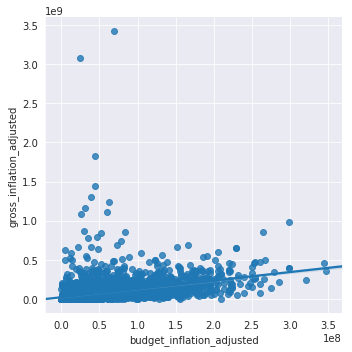

In [0]:
sns.lmplot(x='budget_inflation_adjusted', y='gross_inflation_adjusted', data=df)

In [0]:
((df.gross_inflation_adjusted - df.budget_inflation_adjusted) / df.budget_inflation_adjusted).mean()

4.981767120419759

In [0]:
df.loc[df.budget_inflation_adjusted.idxmax()]

color                                                                       Color
director_name                                                        Carlos Saura
num_critic_for_reviews                                                         35
duration                                                                      115
director_facebook_likes                                                        98
actor_3_facebook_likes                                                          4
actor_2_name                                                   Juan Luis Galiardo
actor_1_facebook_likes                                                        341
gross                                                                 1.68731e+06
genres                                                              Drama|Musical
actor_1_name                                                          Mía Maestro
movie_title                                                                Tango 
num_voted_users 

In [0]:
CPI[CPI['date']==1998]

,date,price_index,mult_factor
82,1998.0,67.91811,1.472361


In [0]:
df.at[3851, 'budget_USD'] = float(df.at[3851, 'budget'] / 194.33)
df.at[3851, 'budget_inflation_adjusted'] = float(df.at[3851, 'budget_USD'] * 1.472361)

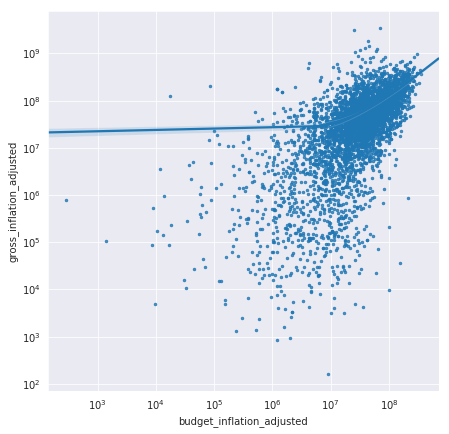

In [0]:
fig, ax = plt.subplots(figsize=(7, 7))
ax.set(xscale="log", yscale="log")
sns.regplot(x='budget_inflation_adjusted', y='gross_inflation_adjusted', data=df, ax=ax, scatter_kws={"s": 6})

In [0]:
df.loc[df.gross_inflation_adjusted.idxmin()]

color                                                                       Color
director_name                                                 Ekachai Uekrongtham
num_critic_for_reviews                                                         66
duration                                                                       96
director_facebook_likes                                                         3
actor_3_facebook_likes                                                        305
actor_2_name                                                           Mike Dopud
actor_1_facebook_likes                                                       2000
gross                                                                         162
genres                                                      Action|Crime|Thriller
actor_1_name                                                    Michael Jai White
movie_title                                                           Skin Trade 
num_voted_users 

In [0]:
df.loc[3330, ['gross', 'gross_inflation_adjusted']] = 595268.0

In [0]:
df['return_on_investment'] = (df['gross_inflation_adjusted'] - df['budget_inflation_adjusted']) / df['budget_inflation_adjusted']
df['margin'] = df['gross_inflation_adjusted'] - df['budget_inflation_adjusted']

In [0]:
new_column_order = [
    'movie_title', 'genres', 'title_year', 'director_name', 
    'actor_1_name', 'actor_2_name', 'actor_3_name',
    'budget', 'budget_USD', 'budget_inflation_adjusted',
    'gross', 'gross_inflation_adjusted',
    'return_on_investment', 'margin',
    'movie_facebook_likes', 'director_facebook_likes', 'actor_1_facebook_likes', 'actor_2_facebook_likes', 'actor_3_facebook_likes', 'cast_total_facebook_likes',
    'facenumber_in_poster', 
    'movie_imdb_link', 'language', 'country',
    'imdb_score', 'num_voted_users', 'num_critic_for_reviews', 'num_user_for_reviews',
    'duration', 'color', 'aspect_ratio',
    'plot_keywords', 'shared_plot_keywords',
    'content_rating', 'suitable_for_children', 'suitable_for_young_teenagers',
    'shown_in_theaters'
]

# check if no column is missing or 
for col in new_column_order:
    if col not in df.columns:
        print(col)
        
for col in df.columns:
    if col not in new_column_order:
        print(col)

In [0]:
df = df[new_column_order]
df.head()

,movie_title,genres,title_year,director_name,actor_1_name,actor_2_name,actor_3_name,budget,budget_USD,budget_inflation_adjusted,...,num_user_for_reviews,duration,color,aspect_ratio,plot_keywords,shared_plot_keywords,content_rating,suitable_for_children,suitable_for_young_teenagers,shown_in_theaters
0,Avatar,Action|Adventure|Fantasy|Sci-Fi,2009.0,James Cameron,CCH Pounder,Joel David Moore,Wes Studi,237000000.0,237000000.0,2.651370e+08,...,3054.0,178.0,1,1.78,avatar|future|marine|native|paraplegic,avatar|future|marine,PG-13,0.0,1.0,1.0
1,Pirates of the Caribbean: At World's End,Action|Adventure|Fantasy,2007.0,Gore Verbinski,Johnny Depp,Orlando Bloom,Jack Davenport,300000000.0,300000000.0,3.472621e+08,...,1238.0,169.0,1,2.35,goddess|marriage ceremony|marriage proposal|pi...,goddess|marriage proposal|pirate|singapore,PG-13,0.0,1.0,1.0
2,Spectre,Action|Adventure|Thriller,2015.0,Sam Mendes,Christoph Waltz,Rory Kinnear,Stephanie Sigman,245000000.0,245000000.0,2.480909e+08,...,994.0,148.0,1,2.35,bomb|espionage|sequel|spy|terrorist,bomb|espionage|sequel|spy|terrorist,PG-13,0.0,1.0,1.0
3,The Dark Knight Rises,Action|Thriller,2012.0,Christopher Nolan,Tom Hardy,Christian Bale,Joseph Gordon-Levitt,250000000.0,250000000.0,2.613388e+08,...,2701.0,164.0,1,2.35,deception|imprisonment|lawlessness|police offi...,deception|imprisonment|police officer|terroris...,PG-13,0.0,1.0,1.0
4,Star Wars: Episode VII - The Force Awakens ...,Documentary,NaN,Doug Walker,Doug Walker,Rob Walker,NaN,NaN,NaN,NaN,...,NaN,NaN,0,NaN,NaN,,NaN,0.0,1.0,1.0


### Réduction des dimensions

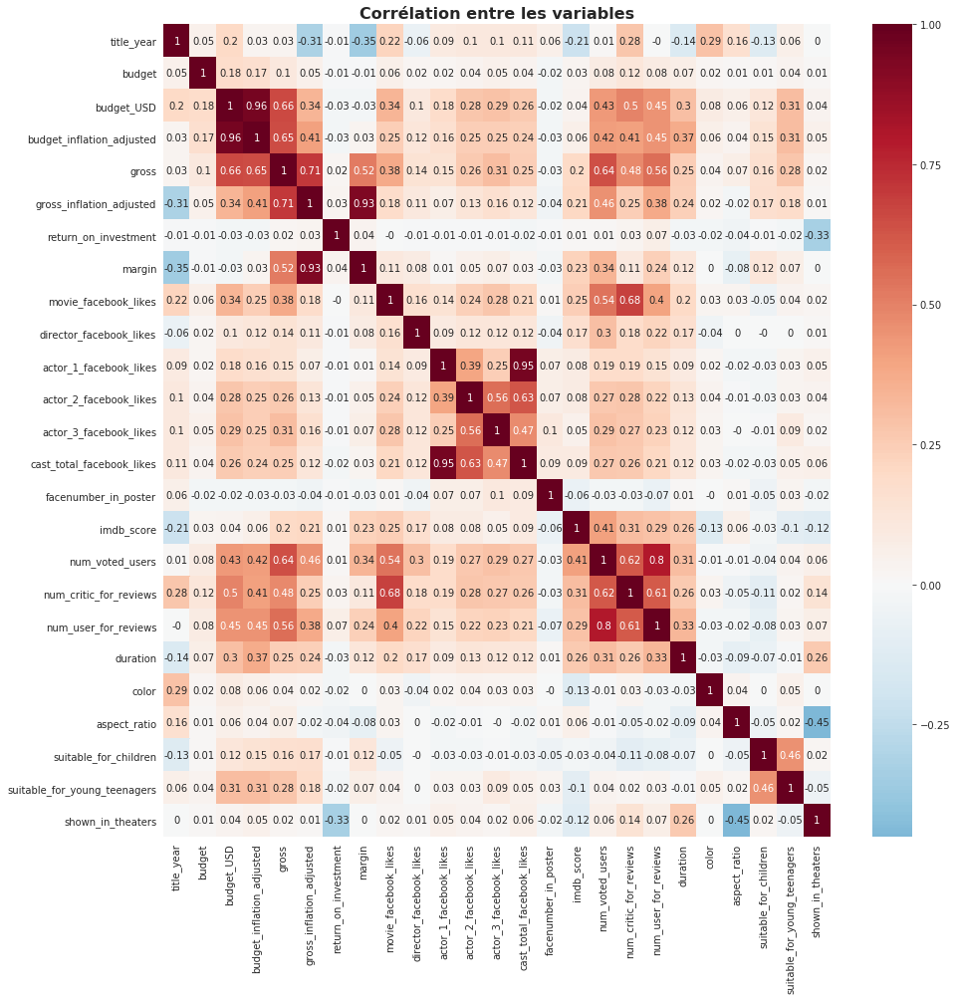

In [0]:
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(df.corr().round(2), annot=True, ax=ax, cmap='RdBu_r', center=0)

plt.title("Corrélation entre les variables", fontweight='bold', fontsize=16)
plt.show()

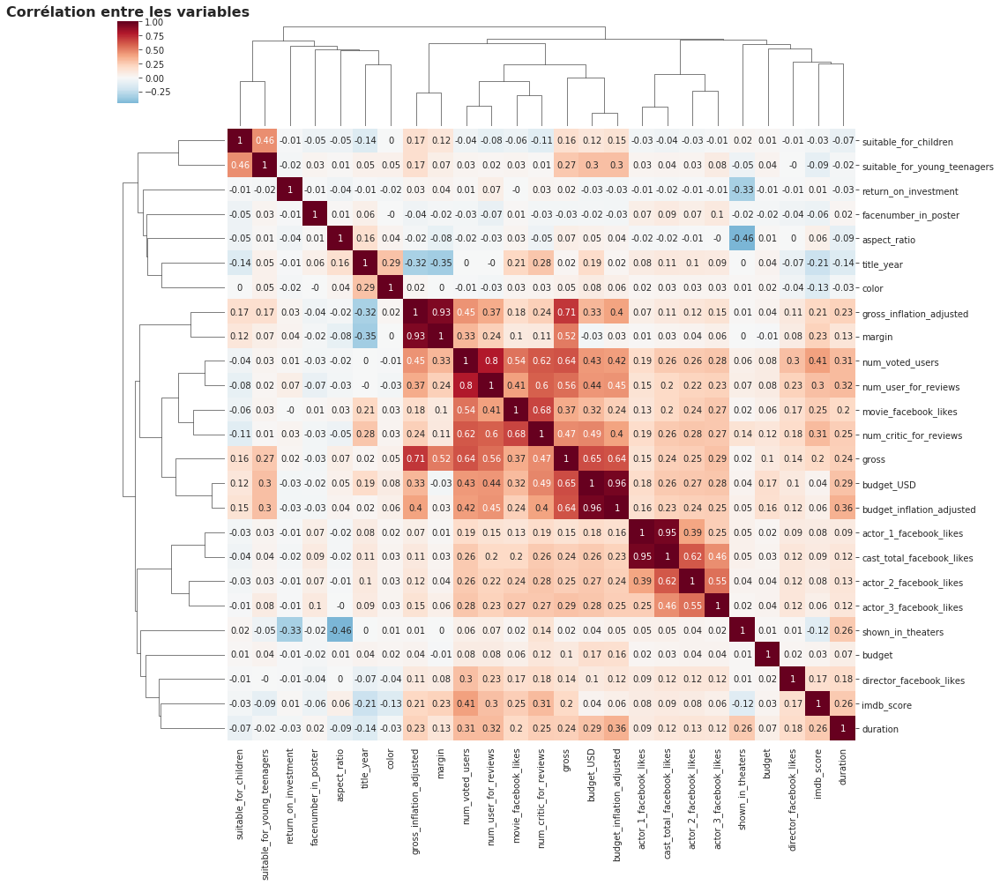

In [0]:
#fig, ax = plt.subplots(figsize=(15, 15))
ax = sns.clustermap(df.corr().round(2), annot=True, cmap='RdBu_r', figsize=(15, 15), center=0)

plt.title("Corrélation entre les variables", fontweight='bold', fontsize=16)
plt.show()

#### Regroupement des colonnes par similarités

In [0]:
popularity_cols = ['movie_facebook_likes', 'num_user_for_reviews', 'num_critic_for_reviews', 'gross_inflation_adjusted', 'margin']
investment_cols = ['budget_inflation_adjusted', 'actor_1_facebook_likes', 'actor_2_facebook_likes', 'actor_3_facebook_likes', 'cast_total_facebook_likes', 'director_facebook_likes', 'shown_in_theaters']
type_cols = ['director_name', 'actor_1_name', 'actor_2_name', 'actor_3_name', 'genres', 'shared_plot_keywords', 'suitable_for_children', 'suitable_for_young_teenagers', 'duration']
age_cols = ['title_year', 'color', 'aspect_ratio']

#### PCA pour décorréler les variables, les centrer, les réduire et diminer leur nombre

In [0]:
means_popularity = df[popularity_cols].mean(axis=0)

sc_popularity = StandardScaler()
X_popularity_scaled = sc_popularity.fit_transform(df[popularity_cols].fillna(means_popularity))

pca_popularity = PCA(len(popularity_cols))
X_popularity_proj = pca_popularity.fit_transform(X_popularity_scaled)
pca_popularity.explained_variance_ratio_

/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/data.py:645: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.

/usr/local/lib/python3.6/dist-packages/sklearn/base.py:464: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.



array([0.5055722 , 0.31053084, 0.11628727, 0.0513466 , 0.01626308])

In [0]:
configure_plotly_browser_state()

trace = dict(
    type='scatter',
    x=X_popularity_proj[:,0],
    y=X_popularity_proj[:,1],
    mode='markers',
    marker=dict(
        size=3,
        line=dict(
            color='rgba(217, 217, 217, 0.14)',
            width=0.5),
        opacity=0.8),
    text=df['movie_title'].values,
)

layout = dict(
    title="Répartition sur F1 et F2",
    xaxis=dict(title='F1', showline=False),
    yaxis=dict(title='F2', showline=False),
    hovermode= 'closest',
)
fig = dict(data=[trace], layout=layout)
iplot(fig)

In [0]:
full_print(df[df['movie_title']=="Gone with the Wind"], columns=0)

,movie_title,genres,title_year,director_name,actor_1_name,actor_2_name,actor_3_name,budget,budget_USD,budget_inflation_adjusted,gross,gross_inflation_adjusted,return_on_investment,margin,movie_facebook_likes,director_facebook_likes,actor_1_facebook_likes,actor_2_facebook_likes,actor_3_facebook_likes,cast_total_facebook_likes,facenumber_in_poster,movie_imdb_link,language,country,imdb_score,num_voted_users,num_critic_for_reviews,num_user_for_reviews,duration,color,aspect_ratio,plot_keywords,shared_plot_keywords,content_rating,suitable_for_children,suitable_for_young_teenagers,shown_in_theaters
3970,Gone with the Wind,Drama|History|Romance|War,1939.0,Victor Fleming,Hattie McDaniel,George Reeves,Thomas Mitchell,3977000.0,3977000.0,6.862848e+07,198655278.0,3.428064e+09,48.951038,3.359435e+09,16000,149.0,503.0,384.0,248.0,1862,1.0,http://www.imdb.com/title/tt0031381/?ref_=fn_t...,English,USA,8.2,215340,157.0,706.0,226.0,1,1.37,battle of the sexes|gallantry|honesty|indiffer...,battle of the sexes|honesty|indifference|scandal,G,1.0,1.0,1.0


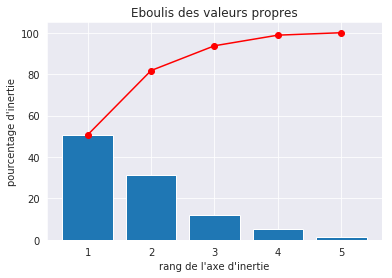

In [0]:
display_scree_plot(pca_popularity)

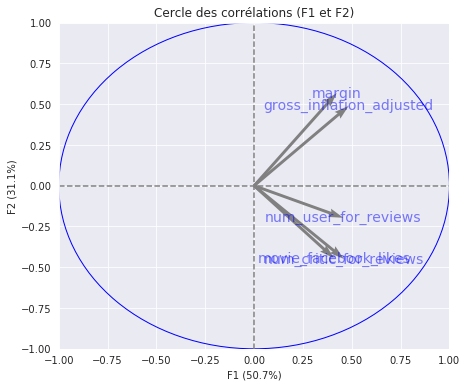

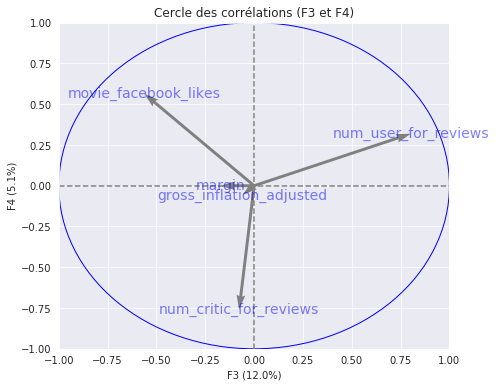

In [0]:
display_circles(pca_popularity, axis_ranks=[(0,1), (2,3)], labels=popularity_cols)

In [0]:
# on garde les n premières variables créées
n_var_popularity = 2

# on effectue un centrage-réduction sur les n premières variables projetées
popularity_score = StandardScaler().fit_transform(X_popularity_proj[:,:n_var_popularity])
popularity_score

array([[ 7.23175642,  1.74700495],
       [ 1.7321964 ,  0.15029415],
       [ 2.89819972, -2.85201244],
       ...,
       [-0.62198641,  0.61750331],
       [-0.7796535 ,  0.36470573],
       [-0.71171386,  0.14412347]])

In [0]:
# on multiplie les nouvelles variables par leur importance (variance expliquée), on ramène la somme des coefficients à 1
popularity_score = (popularity_score *
                    pca_popularity.explained_variance_ratio_[:n_var_popularity]
                    / pca_popularity.explained_variance_ratio_.cumsum()[n_var_popularity])
popularity_score

array([[ 3.92129232,  0.58183672],
       [ 0.93925294,  0.05005518],
       [ 1.57149766, -0.94985739],
       ...,
       [-0.33726115,  0.20565832],
       [-0.42275336,  0.12146456],
       [-0.38591428,  0.04800005]])

In [0]:
popularity_df = pd.DataFrame(popularity_score, index=df.index, columns=['pop_0', 'pop_1'])
popularity_df.head()

,pop_0,pop_1
0,3.921292,0.581837
1,0.939253,0.050055
2,1.571498,-0.949857
3,3.840907,-1.192203
4,-0.055178,0.043364


In [0]:
# les nouvelles variables créées sont bien décorrélées et centrées
display(popularity_df.corr().round(2))
print(popularity_df.mean().round(2))
print(popularity_df.std().round(2))

,pop_0,pop_1
pop_0,1.0,0.0
pop_1,0.0,1.0


pop_0   -0.0
pop_1    0.0
dtype: float64
pop_0    0.54
pop_1    0.33
dtype: float64


In [0]:
means_investment = df[investment_cols].mean(axis=0)

sc_investment = StandardScaler()
X_investment_scaled = sc_investment.fit_transform(df[investment_cols].fillna(means_investment))

pca_investment = PCA(len(investment_cols))
X_investment_proj = pca_investment.fit_transform(X_investment_scaled)
pca_investment.explained_variance_ratio_

/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/data.py:645: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.

/usr/local/lib/python3.6/dist-packages/sklearn/base.py:464: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.



array([3.98408743e-01, 1.52141022e-01, 1.41932886e-01, 1.31351273e-01,
       1.14775971e-01, 6.11160967e-02, 2.74007969e-04])

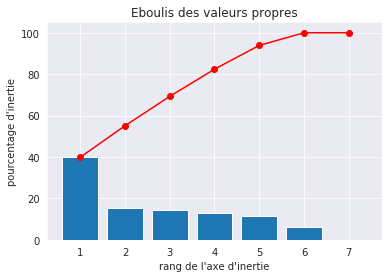

In [0]:
display_scree_plot(pca_investment)

In [0]:
configure_plotly_browser_state()

trace = dict(
    type='scatter',
    x=X_investment_proj[:,0],
    y=X_investment_proj[:,1],
    mode='markers',
    marker=dict(
        size=3,
        line=dict(
            color='rgba(217, 217, 217, 0.14)',
            width=0.5),
        opacity=0.8),
    text=df['movie_title'].values,
)

layout = dict(
    title="Répartition sur F1 et F2",
    xaxis=dict(title='F1', showline=False),
    yaxis=dict(title='F2', showline=False),
    hovermode= 'closest',
)
fig = dict(data=[trace], layout=layout)
iplot(fig)

In [0]:
full_print(df[df['movie_title']=="Anchorman: The Legend of Ron Burgundy"], columns=0)

,movie_title,genres,title_year,director_name,actor_1_name,actor_2_name,actor_3_name,budget,budget_USD,budget_inflation_adjusted,gross,gross_inflation_adjusted,return_on_investment,margin,movie_facebook_likes,director_facebook_likes,actor_1_facebook_likes,actor_2_facebook_likes,actor_3_facebook_likes,cast_total_facebook_likes,facenumber_in_poster,movie_imdb_link,language,country,imdb_score,num_voted_users,num_critic_for_reviews,num_user_for_reviews,duration,color,aspect_ratio,plot_keywords,shared_plot_keywords,content_rating,suitable_for_children,suitable_for_young_teenagers,shown_in_theaters
1902,Anchorman: The Legend of Ron Burgundy,Comedy,2004.0,Adam McKay,Darcy Donavan,Will Ferrell,Steve Carell,26000000.0,26000000.0,3.303725e+07,84136909.0,1.069097e+08,2.236035,7.387245e+07,0,285.0,640000.0,8000.0,7000.0,656730,5.0,http://www.imdb.com/title/tt0357413/?ref_=fn_t...,English,USA,7.2,267921,181.0,577.0,98.0,1,1.85,1970s|anchorman|news anchor|newsroom|tv station,1970s|news anchor|tv station,PG-13,0.0,1.0,1.0


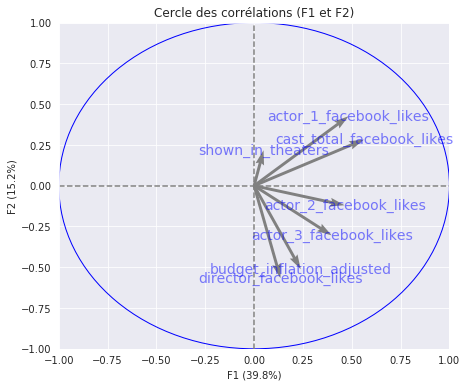

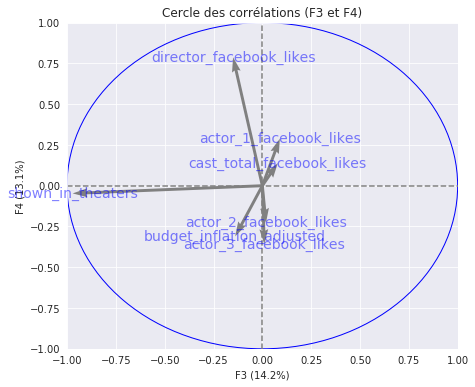

In [0]:
display_circles(pca_investment, axis_ranks=[(0,1), (2,3), (4,5)], labels=investment_cols)

In [0]:
configure_plotly_browser_state()

trace = dict(
    type='scatter',
    x=X_investment_proj[:,1],
    y=X_investment_proj[:,2],
    mode='markers',
    marker=dict(
        size=3,
        line=dict(
            color='rgba(217, 217, 217, 0.14)',
            width=0.5),
        opacity=0.8),
    text=df['movie_title'].values,
)

layout = dict(
    title="Répartition sur F3 et F4",
    xaxis=dict(title='F3', showline=False),
    yaxis=dict(title='F4', showline=False),
    hovermode= 'closest',
)
fig = dict(data=[trace], layout=layout)
iplot(fig)

In [0]:
# Même principe
n_var_investment = 4

investment_score = StandardScaler().fit_transform(X_investment_proj[:, :n_var_investment])
investment_score

investment_score = (investment_score *
                    pca_investment.explained_variance_ratio_[:n_var_investment]
                    / pca_investment.explained_variance_ratio_.cumsum()[n_var_investment])

investment_score
investment_df = pd.DataFrame(investment_score, index=df.index, columns=['inv_0','inv_1', 'inv_2','inv_3'])
display(investment_df.head())

display(investment_df.corr().round(2))
print(investment_df.mean().round(2))
print(investment_df.std().round(2))

,inv_0,inv_1,inv_2,inv_3
0,0.201456,-0.404864,-0.128552,-0.272833
1,1.106190,-0.311561,-0.104180,-0.212577
2,0.255095,-0.290668,-0.108158,-0.193619
3,3.507467,-1.490170,-0.178282,-0.074867
4,-0.178318,-0.020615,-0.031359,-0.038896


,inv_0,inv_1,inv_2,inv_3
inv_0,1.0,-0.0,-0.0,-0.0
inv_1,-0.0,1.0,-0.0,-0.0
inv_2,-0.0,-0.0,1.0,0.0
inv_3,-0.0,-0.0,0.0,1.0


inv_0   -0.0
inv_1    0.0
inv_2    0.0
inv_3    0.0
dtype: float64
inv_0    0.42
inv_1    0.16
inv_2    0.15
inv_3    0.14
dtype: float64


In [0]:
genres

Drama          2594
Comedy         1872
Thriller       1411
Action         1153
Romance        1107
Adventure       923
Crime           889
Sci-Fi          616
Fantasy         610
Horror          565
Family          546
Mystery         500
Biography       293
Animation       242
Music           214
War             213
History         207
Sport           182
Musical         132
Documentary     121
Western          97
Film-Noir         6
Short             5
News              3
Reality-TV        2
Game-Show         1
Name: genres_count, dtype: int64

In [0]:
genre_dummies = pd.DataFrame(index=df.index)
for genre in genres[:21].index:
    genre_dummies[genre] = df.genres.fillna("").str.contains(genre).astype(np.uint8)

genre_dummies.head()

,Drama,Comedy,Thriller,Action,Romance,Adventure,Crime,Sci-Fi,Fantasy,Horror,...,Mystery,Biography,Animation,Music,War,History,Sport,Musical,Documentary,Western
0,0,0,0,1,0,1,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,1,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


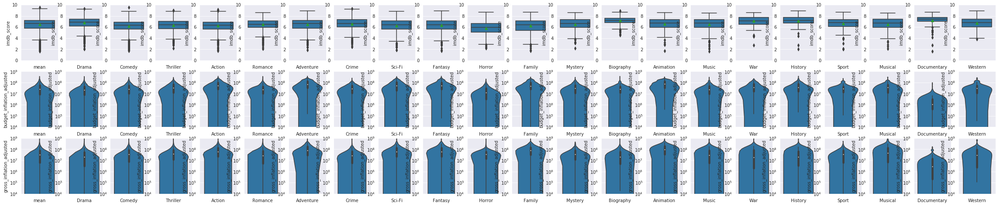

In [0]:
tmp = pd.concat((df, genre_dummies), axis=1)
hue_vars = genre_dummies.columns[:21]
y_vars = ['imdb_score', 'budget_inflation_adjusted', 'gross_inflation_adjusted']

fig, axes = plt.subplots(len(y_vars), 1 + len(hue_vars), figsize=(40,8))

for j in range(axes.shape[1]):
    axes[0, j].set_ylim(bottom=0, top=10)
    axes[1, j].set(yscale="log")
    axes[1, j].set_ylim(bottom=1e4, top=1e9)
    axes[2, j].set(yscale="log")
    axes[2, j].set_ylim(bottom=1e4, top=1e9)

for j, hue in enumerate(['mean'] + list(hue_vars)):
    
    if hue=='mean':
        tmp_j = tmp
    else:
        tmp_j = tmp[tmp[hue]==1]
        
    ax = sns.boxplot(y=y_vars[0], data=tmp_j, orient='v', ax=axes[0, j], showmeans=True)
    ax = sns.violinplot(y=y_vars[1], data=tmp_j, orient='v', ax=axes[1, j])
    ax = sns.violinplot(y=y_vars[2], data=tmp_j, orient='v', ax=axes[2, j])
        
for i in range(axes.shape[0]):
    for j in range(axes.shape[1]):
        axes[i,j].set_xlabel((['mean'] + list(hue_vars))[j])

In [0]:
['mean'] + list(hue_vars)

['mean',
 'Drama',
 'Comedy',
 'Thriller',
 'Action',
 'Romance',
 'Adventure',
 'Crime',
 'Sci-Fi',
 'Fantasy',
 'Horror',
 'Family',
 'Mystery',
 'Biography',
 'Animation',
 'Music',
 'War',
 'History',
 'Sport',
 'Musical',
 'Documentary',
 'Western']

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


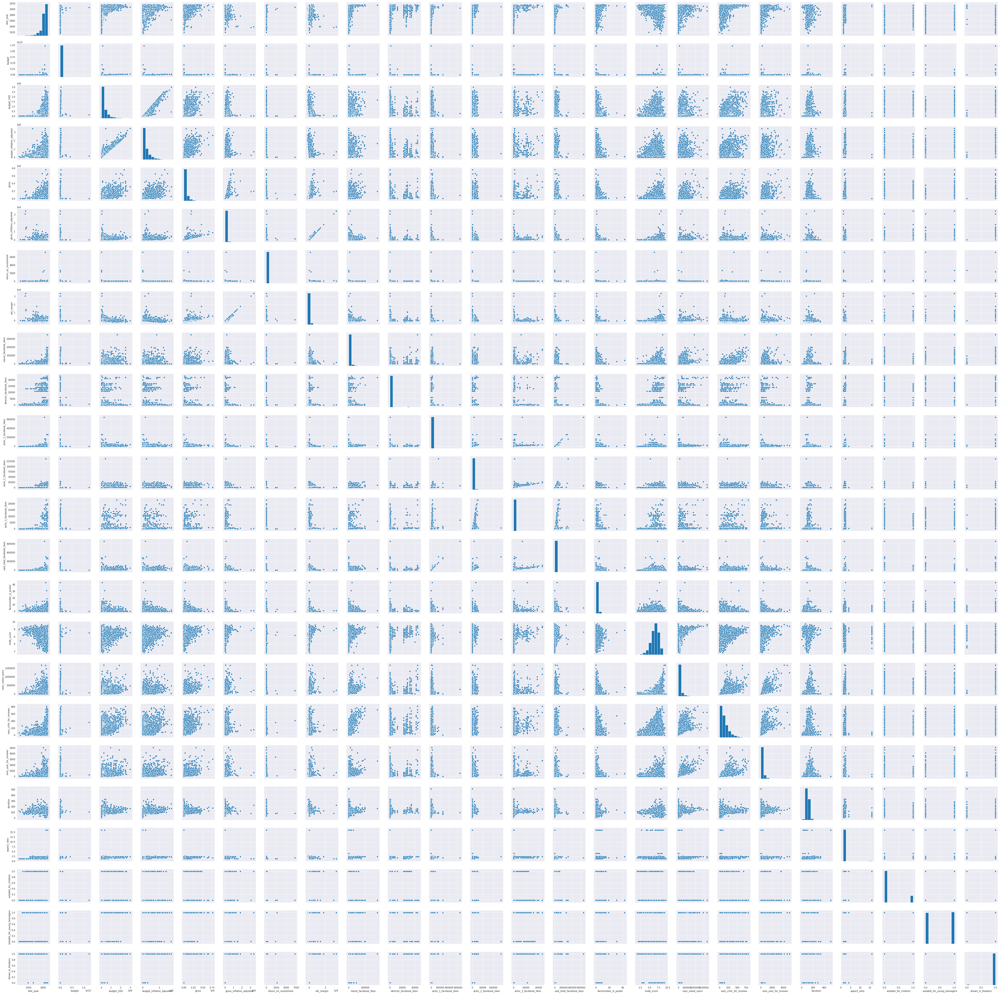

In [0]:
sns.pairplot(data=df)

In [0]:
display(df_genre_rating.genres.dropna().str.replace(" ", "").str.replace("-", ""))
display(df_genre_rating.dropna(subset=['genres'])[['suitable_for_children', 'suitable_for_young_teenagers', 'shown_in_theaters']])

0                          Action|Adventure|Fantasy|SciFi
1                                Action|Adventure|Fantasy
2                               Action|Adventure|Thriller
3                                         Action|Thriller
4                                             Documentary
5                                  Action|Adventure|SciFi
6                                Action|Adventure|Romance
7       Adventure|Animation|Comedy|Family|Fantasy|Musi...
8                                  Action|Adventure|SciFi
9                        Adventure|Family|Fantasy|Mystery
10                                 Action|Adventure|SciFi
11                                 Action|Adventure|SciFi
12                                       Action|Adventure
13                               Action|Adventure|Fantasy
14                               Action|Adventure|Western
15                         Action|Adventure|Fantasy|SciFi
16                        Action|Adventure|Family|Fantasy
17            

,suitable_for_children,suitable_for_young_teenagers,shown_in_theaters
0,0.0,1.0,1.0
1,0.0,1.0,1.0
2,0.0,1.0,1.0
3,0.0,1.0,1.0
4,NaN,NaN,NaN
5,0.0,1.0,1.0
6,0.0,1.0,1.0
7,1.0,1.0,1.0
8,0.0,1.0,1.0
9,1.0,1.0,1.0


In [0]:
df_genre_rating.head()

,genres,content_rating,suitable_for_children,suitable_for_young_teenagers,shown_in_theaters
0,Action|Adventure|Fantasy|Sci-Fi,PG-13,0.0,1.0,1.0
1,Action|Adventure|Fantasy,PG-13,0.0,1.0,1.0
2,Action|Adventure|Thriller,PG-13,0.0,1.0,1.0
3,Action|Thriller,PG-13,0.0,1.0,1.0
4,Documentary,NaN,NaN,NaN,NaN


C:\Users\Jerome\Anaconda3\envs\py37\lib\site-packages\numpy\lib\histograms.py:754: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\Jerome\Anaconda3\envs\py37\lib\site-packages\numpy\lib\histograms.py:755: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


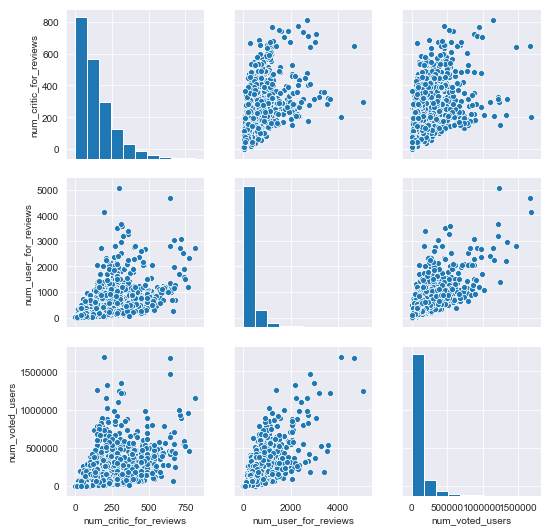

In [0]:
sns.pairplot(
    vars=['num_critic_for_reviews', 'num_user_for_reviews', 'num_voted_users'], 
    data=df
)

In [0]:
full_print(df.sort_values('imdb_score', ascending=False)[:10], columns=0)

,movie_title,genres,title_year,director_name,actor_1_name,actor_2_name,actor_3_name,budget,budget_USD,budget_inflation_adjusted,gross,gross_inflation_adjusted,return_on_investment,margin,movie_facebook_likes,director_facebook_likes,actor_1_facebook_likes,actor_2_facebook_likes,actor_3_facebook_likes,cast_total_facebook_likes,facenumber_in_poster,movie_imdb_link,language,country,imdb_score,num_voted_users,num_critic_for_reviews,num_user_for_reviews,duration,color,aspect_ratio,plot_keywords,shared_plot_keywords,content_rating,suitable_for_children,suitable_for_young_teenagers,shown_in_theaters
2765,Towering Inferno,Comedy,NaN,John Blanchard,Martin Short,Andrea Martin,Joe Flaherty,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,770.0,179.0,176.0,1125,2.0,http://www.imdb.com/title/tt0691996/?ref_=fn_t...,English,Canada,9.5,10,NaN,NaN,65.0,1,1.33,NaN,,NaN,0.0,0.0,1.0
1937,The Shawshank Redemption,Crime|Drama,1994.0,Frank Darabont,Morgan Freeman,Jeffrey DeMunn,Bob Gunton,25000000.0,25000000.0,4.048021e+07,28341469.0,4.589075e+07,0.133659,5.410535e+06,108000,0.0,11000.0,745.0,461.0,13495,0.0,http://www.imdb.com/title/tt0111161/?ref_=fn_t...,English,USA,9.3,1689764,199.0,4144.0,142.0,1,1.85,escape from prison|first person narration|pris...,escape from prison|first person narration|prison,R,0.0,0.0,1.0
3466,The Godfather,Crime|Drama,1972.0,Francis Ford Coppola,Al Pacino,Marlon Brando,Robert Duvall,6000000.0,6000000.0,3.443706e+07,134821952.0,7.738119e+08,21.470325,7.393749e+08,43000,0.0,14000.0,10000.0,3000.0,28122,1.0,http://www.imdb.com/title/tt0068646/?ref_=fn_t...,English,USA,9.2,1155770,208.0,2238.0,175.0,1,1.85,crime family|mafia|organized crime|patriarch|r...,crime family|mafia|organized crime|patriarch,R,0.0,0.0,1.0
4409,Kickboxer: Vengeance,Action,2016.0,John Stockwell,Matthew Ziff,T.J. Storm,Sam Medina,17000000.0,10000000.0,1.000000e+07,NaN,NaN,NaN,NaN,0,134.0,260000.0,454.0,354.0,261818,5.0,http://www.imdb.com/title/tt3082898/?ref_=fn_t...,NaN,USA,9.1,246,2.0,1.0,90.0,0,NaN,NaN,,NaN,0.0,1.0,1.0
2824,Dekalog,Drama,NaN,NaN,Krystyna Janda,Olaf Lubaszenko,Olgierd Lukaszewicz,NaN,NaN,NaN,447093.0,4.470930e+05,NaN,NaN,0,NaN,20.0,3.0,2.0,25,0.0,http://www.imdb.com/title/tt0092337/?ref_=fn_t...,Polish,Poland,9.1,12590,53.0,37.0,55.0,1,1.33,meaning of life|moral challenge|morality|searc...,meaning of life|moral challenge|morality|searc...,TV-MA,0.0,0.0,0.0
3207,Dekalog,Drama,NaN,NaN,Krystyna Janda,Olaf Lubaszenko,Olgierd Lukaszewicz,NaN,NaN,NaN,447093.0,4.470930e+05,NaN,NaN,0,NaN,20.0,3.0,2.0,25,0.0,http://www.imdb.com/title/tt0092337/?ref_=fn_t...,Polish,Poland,9.1,12591,53.0,37.0,55.0,1,1.33,meaning of life|moral challenge|morality|searc...,meaning of life|moral challenge|morality|searc...,TV-MA,0.0,0.0,0.0
66,The Dark Knight,Action|Crime|Drama|Thriller,2008.0,Christopher Nolan,Christian Bale,Heath Ledger,Morgan Freeman,185000000.0,185000000.0,2.062276e+08,533316061.0,5.945108e+08,1.882790,3.882832e+08,37000,22000.0,23000.0,13000.0,11000.0,57802,0.0,http://www.imdb.com/title/tt0468569/?ref_=fn_t...,English,USA,9.0,1676169,645.0,4667.0,152.0,1,2.35,based on comic book|dc comics|psychopath|star ...,based on comic book|dc comics|psychopath|star ...,PG-13,0.0,1.0,1.0
2837,The Godfather: Part II,Crime|Drama,1974.0,Francis Ford Coppola,Robert De Niro,Al Pacino,Robert Duvall,13000000.0,13000000.0,6.327718e+07,57300000.0,2.789064e+08,3.407692,2.156292e+08,14000,0.0,22000.0,14000.0,3000.0,39960,1.0,http://www.imdb.com/title/tt0071562/?ref_=fn_t...,English,USA,9.0,790926,149.0,650.0,220.0,1,1.85,1950s|corrupt politician|lake tahoe nevada|mel...,1950s|corrupt politician|melancholy|revenge,R,0.0,0.0,1.0
3481,Fargo,Crime|Drama|Thriller,NaN,NaN,Kirsten Dunst,Adam Goldberg,Oliver Platt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61000,NaN,4000.0,1000.0,1000.0,19949,0.0,http://www.imdb.com/title/tt2802850/?ref_=fn_t...,English,USA,9.0,170055,54.0,173.0,53.0,1,1.78,anthology|death|insurance salesman|minnesota|p...,anthology|death|minnesota|police officer,TV-MA,0.0,0.0,0.0
339,T

### Des valeurs dupliquées à supprimer

In [0]:
df.duplicated(subset='movie_title', keep=False).sum()

245

In [0]:
df[df.duplicated(subset=['movie_title', 'director_name'], keep=False)].sort_values('movie_title')

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
3711,Color,Richard Fleischer,69.0,127.0,130.0,51.0,Robert J. Wilke,617.0,NaN,Adventure|Drama|Family|Fantasy|Sci-Fi,...,108.0,English,USA,Approved,5000000.0,1954.0,53.0,7.2,1.37,0
4894,Color,Richard Fleischer,69.0,127.0,130.0,51.0,Robert J. Wilke,618.0,NaN,Adventure|Drama|Family|Fantasy|Sci-Fi,...,108.0,English,USA,Approved,5000000.0,1954.0,53.0,7.2,1.37,0
4950,Color,David Hewlett,8.0,88.0,686.0,405.0,David Hewlett,847.0,NaN,Comedy,...,46.0,English,Canada,NaN,120000.0,2007.0,686.0,7.0,1.78,377
4949,Color,David Hewlett,8.0,88.0,686.0,405.0,David Hewlett,847.0,NaN,Comedy,...,46.0,English,Canada,NaN,120000.0,2007.0,686.0,7.0,1.78,377
1420,Color,Wes Craven,256.0,101.0,0.0,574.0,Lin Shaye,40000.0,26505000.0,Horror,...,668.0,English,USA,X,1800000.0,1984.0,852.0,7.5,1.85,10000
4352,Color,Wes Craven,256.0,101.0,0.0,574.0,Lin Shaye,40000.0,26505000.0,Horror,...,668.0,English,USA,X,1800000.0,1984.0,852.0,7.5,1.85,10000
3007,Color,Yimou Zhang,101.0,95.0,611.0,3.0,Ni Yan,9.0,190666.0,Comedy|Drama,...,20.0,Mandarin,China,R,NaN,2009.0,4.0,5.7,2.35,784
4408,Color,Yimou Zhang,101.0,95.0,611.0,3.0,Ni Yan,9.0,190666.0,Comedy|Drama,...,20.0,Mandarin,China,R,NaN,2009.0,4.0,5.7,2.35,784
1113,Color,Julie Taymor,156.0,133.0,278.0,107.0,T.V. Carpio,5000.0,24343673.0,Drama|Fantasy|Musical|Romance,...,524.0,English,USA,PG-13,45000000.0,2007.0,117.0,7.4,2.35,14000
4842,Color,Julie Taymor,156.0,133.0,278.0,107.0,T.V. Carpio,5000.0,24343673.0,Drama|Fantasy|Musical|Romance,...,524.0,English,USA,PG-13,45000000.0,2007.0,117.0,7.4,2.35,14000


In [0]:
df.duplicated(subset=['movie_imdb_link'], keep=False).sum()

241

In [0]:
df.duplicated(keep=False).sum()

90

In [0]:
full_print(df[
                (df.duplicated(subset=['movie_title', 'director_name'], keep=False))
             & ~(df.duplicated(keep=False))
           ].sort_values('movie_title'),
columns=0)


,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,num_voted_users,cast_total_facebook_likes,actor_3_name,facenumber_in_poster,plot_keywords,movie_imdb_link,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
3711,Color,Richard Fleischer,69.0,127.0,130.0,51.0,Robert J. Wilke,617.0,NaN,Adventure|Drama|Family|Fantasy|Sci-Fi,James Mason,"20,000 Leagues Under the Sea",22123,799,Paul Lukas,0.0,captain|expedition|sea|submarine|whale,http://www.imdb.com/title/tt0046672/?ref_=fn_t...,108.0,English,USA,Approved,5000000.0,1954.0,53.0,7.2,1.37,0
4894,Color,Richard Fleischer,69.0,127.0,130.0,51.0,Robert J. Wilke,618.0,NaN,Adventure|Drama|Family|Fantasy|Sci-Fi,James Mason,"20,000 Leagues Under the Sea",22124,800,Paul Lukas,0.0,captain|expedition|sea|submarine|whale,http://www.imdb.com/title/tt0046672/?ref_=fn_t...,108.0,English,USA,Approved,5000000.0,1954.0,53.0,7.2,1.37,0
4352,Color,Wes Craven,256.0,101.0,0.0,574.0,Lin Shaye,40000.0,26505000.0,Horror,Johnny Depp,A Nightmare on Elm Street,149293,42918,Amanda Wyss,1.0,freddy krueger|lucid dream|serial killer|slash...,http://www.imdb.com/title/tt0087800/?ref_=fn_t...,668.0,English,USA,X,1800000.0,1984.0,852.0,7.5,1.85,10000
1420,Color,Wes Craven,256.0,101.0,0.0,574.0,Lin Shaye,40000.0,26505000.0,Horror,Johnny Depp,A Nightmare on Elm Street,149285,42918,Amanda Wyss,1.0,freddy krueger|lucid dream|serial killer|slash...,http://www.imdb.com/title/tt0087800/?ref_=fn_t...,668.0,English,USA,X,1800000.0,1984.0,852.0,7.5,1.85,10000
4842,Color,Julie Taymor,156.0,133.0,278.0,107.0,T.V. Carpio,5000.0,24343673.0,Drama|Fantasy|Musical|Romance,Jim Sturgess,Across the Universe,91863,5405,Robert Clohessy,0.0,anti war|liverpool|love|protest|song,http://www.imdb.com/title/tt0445922/?ref_=fn_t...,524.0,English,USA,PG-13,45000000.0,2007.0,117.0,7.4,2.35,14000
1113,Color,Julie Taymor,156.0,133.0,278.0,107.0,T.V. Carpio,5000.0,24343673.0,Drama|Fantasy|Musical|Romance,Jim Sturgess,Across the Universe,91860,5405,Robert Clohessy,0.0,anti war|liverpool|love|protest|song,http://www.imdb.com/title/tt0445922/?ref_=fn_t...,524.0,English,USA,PG-13,45000000.0,2007.0,117.0,7.4,2.35,14000
4128,Color,Tim Burton,451.0,108.0,13000.0,11000.0,Alan Rickman,40000.0,334185206.0,Adventure|Family|Fantasy,Johnny Depp,Alice in Wonderland,306336,79957,Anne Hathaway,0.0,alice in wonderland|mistaking reality for drea...,http://www.imdb.com/title/tt1014759/?ref_=fn_t...,736.0,English,USA,PG,200000000.0,2010.0,25000.0,6.5,1.85,24000
33,Color,Tim Burton,451.0,108.0,13000.0,11000.0,Alan Rickman,40000.0,334185206.0,Adventure|Family|Fantasy,Johnny Depp,Alice in Wonderland,306320,79957,Anne Hathaway,0.0,alice in wonderland|mistaking reality for drea...,http://www.imdb.com/title/tt1014759/?ref_=fn_t...,736.0,English,USA,PG,200000000.0,2010.0,25000.0,6.5,1.85,24000
2639,Color,Cameron Crowe,138.0,105.0,488.0,13000.0,Bradley Cooper,15000.0,20991497.0,Comedy|Drama|Romance,Emma Stone,Aloha,39782,44037,Bill Murray,1.0,box office flop|critically bashed|hawaii|one w...,http://www.imdb.com/title/tt1243974/?ref_=fn_t...,172.0,English,USA,PG-13,37000000.0,2015.0,14000.0,5.4,1.85,11000
1389,Color,Cameron Crowe,138.0,105.0,488.0,13000.0,Bradley Cooper,15000.0,20991497.0,Comedy|Drama|Romance,Emma Stone,Aloha,39778,44037,Bill Murray,1.0,box office flop|critically bashed|hawaii|one w...,http://www.imdb.com/title/tt1243974/?ref_=fn_t...,172.0,English,USA,PG-13,37000000.0,2015.0,14000.0,5.4,1.85,11000


Différences sur "num_voted_users"

In [0]:
with pd.option_context('max_columns', 0):
    display(df[
        (df.duplicated(subset=['movie_title', 'director_name', 'num_voted_users'], keep=False))
         & ~(df.duplicated(keep=False))
    ].sort_values('movie_title'))


,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,num_voted_users,cast_total_facebook_likes,actor_3_name,facenumber_in_poster,plot_keywords,movie_imdb_link,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
1705,Color,Andy Cadiff,65.0,101.0,3.0,120.0,Stark Sands,448.0,12189514.0,Comedy|Romance,Annabella Sciorra,Chasing Liberty,30092,842,Terence Maynard,0.0,first daughter|photographer|prague|president|s...,http://www.imdb.com/title/tt0360139/?ref_=fn_t...,129.0,English,USA,PG-13,23000000.0,2004.0,143.0,6.1,2.35,0
2063,Color,Andy Cadiff,65.0,101.0,3.0,120.0,Stark Sands,448.0,12189514.0,Comedy|Romance,Annabella Sciorra,Chasing Liberty,30092,829,Terence Maynard,0.0,first daughter|photographer|prague|president|s...,http://www.imdb.com/title/tt0360139/?ref_=fn_t...,129.0,English,USA,PG-13,23000000.0,2004.0,143.0,6.1,2.35,0
84,Color,Roland Joffé,10.0,109.0,596.0,283.0,Alice Englert,622.0,NaN,Action|Adventure|Romance|Sci-Fi,Tamsin Egerton,The Lovers,2138,1982,Bipasha Basu,3.0,1770s|british india|great barrier reef|india|ring,http://www.imdb.com/title/tt1321869/?ref_=fn_t...,15.0,English,Belgium,R,NaN,2015.0,525.0,4.5,NaN,677
1508,Color,Roland Joffé,10.0,109.0,596.0,282.0,Alice Englert,621.0,NaN,Action|Adventure|Romance|Sci-Fi,Tamsin Egerton,The Lovers,2138,1980,Bipasha Basu,3.0,1770s|british india|great barrier reef|india|ring,http://www.imdb.com/title/tt1321869/?ref_=fn_t...,15.0,English,Belgium,R,NaN,2015.0,525.0,4.5,NaN,677


Différences sur les likes Facebook

In [0]:
num_cols = [col for col in df.columns if np.issubdtype(df[col].dtype, np.number)]

In [0]:
num_cols

['num_critic_for_reviews',
 'duration',
 'director_facebook_likes',
 'actor_3_facebook_likes',
 'actor_1_facebook_likes',
 'gross',
 'num_voted_users',
 'cast_total_facebook_likes',
 'facenumber_in_poster',
 'num_user_for_reviews',
 'budget',
 'title_year',
 'actor_2_facebook_likes',
 'imdb_score',
 'aspect_ratio',
 'movie_facebook_likes']

In [0]:
df.groupby(by=['movie_title', 'director_name'])[num_cols].max()[Dekalog]

,,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
movie_title,director_name,,,,,,,,,,,,,,,,
#Horror,Tara Subkoff,35.0,101.0,37.0,56.0,501.0,NaN,1547,1044,1.0,42.0,1500000.0,2015.0,418.0,3.3,NaN,750
10 Cloverfield Lane,Dan Trachtenberg,411.0,104.0,16.0,82.0,14000.0,71897215.0,126893,14504,0.0,440.0,15000000.0,2016.0,338.0,7.3,2.35,33000
10 Days in a Madhouse,Timothy Hines,1.0,111.0,0.0,247.0,1000.0,14616.0,314,2059,1.0,10.0,12000000.0,2015.0,445.0,7.5,1.85,26000
10 Things I Hate About You,Gil Junger,133.0,97.0,19.0,835.0,23000.0,38176108.0,222099,37907,6.0,549.0,16000000.0,1999.0,13000.0,7.2,1.85,10000
"10,000 B.C.",Christopher Barnard,NaN,22.0,0.0,NaN,5.0,NaN,6,5,0.0,NaN,NaN,NaN,NaN,7.2,NaN,0
102 Dalmatians,Kevin Lima,84.0,100.0,36.0,439.0,2000.0,66941559.0,26413,4182,1.0,77.0,85000000.0,2000.0,795.0,4.8,1.85,372
10th & Wolf,Robert Moresco,26.0,107.0,53.0,463.0,954.0,53481.0,5557,2512,5.0,34.0,8000000.0,2006.0,551.0,6.4,2.35,294
11:14,Greg Marcks,68.0,85.0,9.0,407.0,861.0,NaN,38273,2200,1.0,133.0,6000000.0,2003.0,618.0,7.2,1.85,0
12 Angry Men,Sidney Lumet,177.0,96.0,0.0,253.0,359.0,NaN,447785,1433,1.0,888.0,350000.0,1957.0,259.0,8.9,1.66,40000


In [0]:
def remove_duplicates(df):
    num_cols = [col for col in df.columns if np.issubdtype(df[col].dtype, np.number)]
    
    # must fill nan values to avoid them being drop during the groupby operation
    df['director_name'] = df['director_name'].fillna("nan")
    max_num_values = df.groupby(by=['movie_title', 'director_name'])[num_cols].max()
    
    duplicated_rows = df[
        (df.duplicated(subset=['movie_title', 'director_name'], keep=False))
        & ~(df.duplicated(keep=False))
    ].index

    # fill numeric columns with highest value where movie_title and director_name are the same
    for i in duplicated_rows:
        title = df.at[i, 'movie_title']
        director = df.at[i, 'director_name']
        for col in num_cols:
            df.at[i, col] = max_num_values.loc[(title, director), col]
    
    return df.drop_duplicates(subset=['movie_title', 'director_name'], keep='first')
                                           
df = remove_duplicates(df)

#### Des chaines de charactères posent problème

In [0]:
for movie in df.movie_title:
    if "Dekalog" in movie:
        print('"'+movie+'"')

"Dekalog             "
"Dekalog             "


In [0]:
df_obj = df.select_dtypes(['object'])
df[df_obj.columns] = df_obj.apply(lambda x: x.str.strip())
del df_obj

### Analyse textuelle

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer

vect_plot = TfidfVectorizer()
X_plot = vect_plot.fit_transform(df.shared_plot_keywords)

In [0]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

km_plot = {}
inertia_plot = []
silhouette_score_plot = []

K = range(1,81)

for k in K:
    km_plot[k] = KMeans(k)
    km_plot[k] = km_plot[k].fit(X_plot)
    inertia_plot.append(km_plot[k].inertia_)
    if k==1:
        silhouette_score_plot.append(0)
    else:
        silhouette_score_plot.append(silhouette_score(X_plot, km_plot[k].labels_))

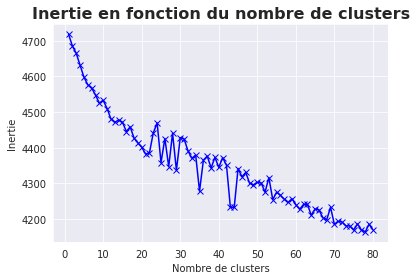

In [0]:
import matplotlib.pyplot as plt
plt.plot(K, inertia_plot, 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Inertie')
plt.title('Inertie en fonction du nombre de clusters', fontdict={'fontweight': 'bold', 'fontsize': 16})
plt.show()

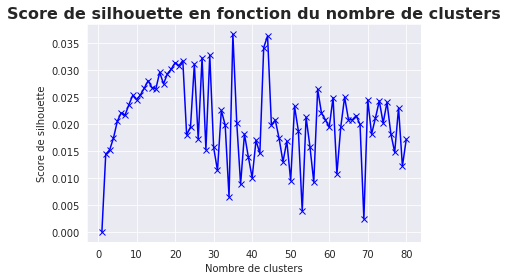

In [0]:
plt.plot(K, silhouette_score_plot, 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette en fonction du nombre de clusters', fontdict={'fontweight': 'bold', 'fontsize': 16})
plt.show()

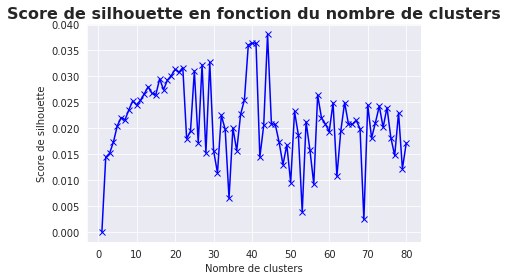

In [0]:
for k in range(35, 46):
  km_plot[k] = KMeans(k, n_init=50)
  km_plot[k] = km_plot[k].fit(X_plot)
  
  silhouette_score_plot[k-1] = silhouette_score(X_plot, km_plot[k].labels_)

plt.plot(K, silhouette_score_plot, 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette en fonction du nombre de clusters', fontdict={'fontweight': 'bold', 'fontsize': 16})
plt.show()

On garde k = 39

In [0]:
km_plot[39] = KMeans(39, n_init=200)
km_plot[39] = km_plot[39].fit(X_plot)

In [0]:
np.unique(km_plot[39].labels_, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38], dtype=int32),
 array([ 158,   66, 1975,  128,   56,   65,   24,   68,   55,   49,   74,
         116,  125,   86,  104,  110,  110,  110,   62,   84,  132,   37,
          50,   95,   74,   35,   93,   45,   36,   38,   44,   62,   44,
          73,   84,   69,  116,   56,  111]))

In [0]:
i = np.random.randint(0,40)
df[km_plot[39].labels_==i].sample(10)

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,shared_plot_keywords
3509,Color,nan,11.0,60.0,NaN,652.0,Ashley Scott,10000.0,NaN,Action|Drama|Mystery|Sci-Fi,...,English,USA,TV-14,NaN,NaN,794.0,7.4,1.33,0,female lead|future|mixed martial arts|post apo...
908,Color,Robert Rodriguez,250.0,189.0,0.0,1000.0,Rosario Dawson,16000.0,25031037.0,Action|Horror|Thriller,...,English,USA,R,53000000.0,2007.0,3000.0,7.6,2.35,0,zombie
4254,Black and White,George Miller,177.0,87.0,750.0,41.0,Bruce Spence,745.0,9003011.0,Action|Adventure|Sci-Fi|Thriller,...,English,Australia,R,2000000.0,1981.0,531.0,7.6,2.35,0,australian|post apocalypse|warrior
4820,Color,Chad Kapper,4.0,98.0,0.0,0.0,Natalie Welch,196.0,NaN,Family|Sci-Fi,...,English,USA,NaN,350000.0,2015.0,3.0,3.4,2.35,240,drone|post apocalypse|road trip
4410,Color,Alfred Hitchcock,97.0,95.0,13000.0,82.0,Rhonda Fleming,472.0,NaN,Film-Noir|Mystery|Romance|Thriller,...,English,USA,Unrated,1696377.0,1945.0,239.0,7.6,1.37,0,amnesia|dream sequence|post traumatic stress d...
2048,Color,Ruben Fleischer,445.0,88.0,181.0,11.0,Bill Murray,15000.0,75590286.0,Adventure|Comedy|Horror|Sci-Fi,...,English,USA,R,23600000.0,2009.0,13000.0,7.7,2.35,26000,amusement park|on the road|zombie|zombie apoca...
83,Color,Matt Reeves,521.0,130.0,198.0,884.0,Judy Greer,10000.0,208543795.0,Action|Adventure|Drama|Sci-Fi,...,English,USA,PG-13,170000000.0,2014.0,2000.0,7.6,1.85,45000,ape|dam|leader|post apocalypse|sequel
4340,Color,Scott Dow,23.0,88.0,6.0,233.0,Wray Crawford,680.0,NaN,Comedy|Horror,...,English,USA,R,1250000.0,2015.0,418.0,3.4,NaN,0,zombie|zombie spoof
3741,Color,Edgar Wright,246.0,99.0,1000.0,358.0,Dylan Moran,605.0,13464388.0,Comedy|Horror,...,English,UK,R,4000000.0,2004.0,427.0,8.0,2.35,19000,british horror|zombie|zombie apocalypse
2387,Black and White,George A. Romero,252.0,97.0,0.0,233.0,Shawn Roberts,654.0,20433940.0,Horror,...,English,Canada,R,15000000.0,2005.0,529.0,6.2,2.35,0,apocalypse|mercenary|skyscraper|urban setting|...


#### Visualisation des données

In [0]:
from sklearn.manifold import TSNE
tsne_plot = TSNE(n_components=2, init='pca')
X_trans = tsne_plot.fit_transform(X_plot.toarray())

KeyboardInterrupt: ignored

Trop de dimensions pour un t-SNE.

In [0]:
import umap

umap = umap.UMAP(n_neighbors=6, min_dist=.5)
X_trans_plot = umap.fit_transform(X_genre)

/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 98 separate connected components using meta-embedding (experimental)
  n_components
/usr/local/lib/python3.6/dist-packages/umap/spectral.py:182: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "WARNING: spectral initialisation failed! The eigenvector solver\n"
/usr/local/lib/python3.6/dist-packages/umap/spectral.py:182: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "WARNING: spectral initialisation failed! The eigenvector solver\n"


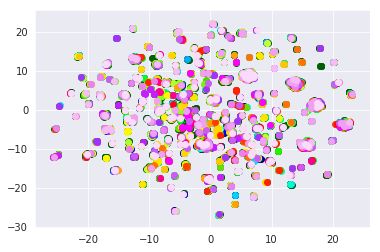

In [0]:
for i in range(39):
    X = X_trans_plot[km_plot[39].labels_==i]
    plt.scatter(X[:,0], X[:,1], color=plt.cm.gist_ncar(i/39))

On lance un K-Means pour identifier les clusters créés en 2D

In [0]:
km_umap = {}
inertia_umap = []
silhouette_score_umap = []

K = range(1,81)

for k in K:
    km_umap[k] = KMeans(k)
    km_umap[k] = km_umap[k].fit(X_trans_plot)
    inertia_umap.append(km_umap[k].inertia_)
    if k==1:
        silhouette_score_umap.append(0)
    else:
        silhouette_score_umap.append(silhouette_score(X_trans_plot, km_umap[k].labels_))

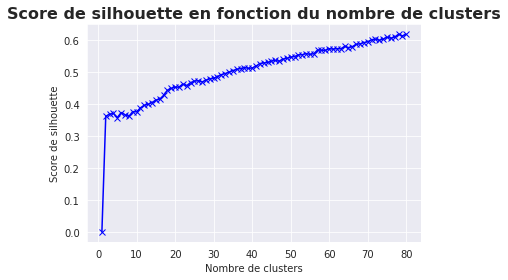

In [0]:
plt.plot(K, silhouette_score_umap, 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette en fonction du nombre de clusters', fontdict={'fontweight': 'bold', 'fontsize': 16})
plt.show()

In [0]:
with pd.option_context('max_columns', 0, 'max_colwidth', 500):
  i = np.random.randint(0, 80)
  n_samples = min(10, (km_umap[80].labels_==i).sum())
  display(df[km_umap[39].labels_==i][['movie_title', 'genres', 'shared_plot_keywords']].sample(n_samples))


,movie_title,genres,shared_plot_keywords
363,Tropic Thunder,Action|Comedy,film director|parody|spoof|vietnam|written and directed by cast member
2207,Team America: World Police,Action|Comedy,actor|arab stereotype|terrorist|vomiting
4019,In the Name of the King: The Last Job,Action|Adventure|Fantasy|Thriller,castle|dragon|kidnapping|satire|sword and sorcery
325,The Mummy Returns,Action|Adventure|Fantasy|Thriller,ancient egypt|king|scorpion|son
1772,Kick-Ass,Action|Comedy,comic book|hit in the crotch|narrated by character|reference to batman
3145,Kung Pow: Enter the Fist,Action|Comedy,chosen one|comic violence|kung fu|stylized violence
3407,The Wicked Lady,Adventure|Drama,female nudity|nudity|whipping
4285,"The Book of Mormon Movie, Volume 1: The Journey",Adventure,jerusalem|journey|ship|wilderness
342,Lara Croft: Tomb Raider,Action|Adventure|Fantasy|Thriller,illuminati|time
371,You Don't Mess with the Zohan,Action|Comedy,jew|landlord|muslim|palestinian


In [0]:
word_frequency_url = "https://github.com/JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films/raw/master/unigram_freq.csv"
word_freq = pd.read_csv(word_frequency_url)
word_freq.head(10)

,word,count
0,the,23135851162
1,of,13151942776
2,and,12997637966
3,to,12136980858
4,a,9081174698
5,in,8469404971
6,for,5933321709
7,is,4705743816
8,on,3750423199
9,that,3400031103


In [0]:
word_freq[word_freq['word']=='avatar']

,word,count
3552,avatar,21069571


In [0]:
total_word_count = word_freq['count'].sum()

In [0]:
movie_titles_cleaned = df.movie_title.str.lower().str.normalize('NFKD')
movie_titles_cleaned = movie_titles_cleaned.str.replace("[^a-z]+", " ").str.strip()

In [0]:
word_freq['frequency_score'] = np.sqrt(total_word_count / word_freq['count'])

In [0]:
word_freq.head(100)

,word,count,frequency_score
0,the,23135851162,5.041872
1,of,13151942776,6.687127
2,and,12997637966,6.726704
3,to,12136980858,6.961121
4,a,9081174698,8.047547
5,in,8469404971,8.333129
6,for,5933321709,9.956016
7,is,4705743816,11.179449
8,on,3750423199,12.522597
9,that,3400031103,13.152039


In [0]:
word_freq[3000:3010]

,word,count,frequency_score
3000,hills,25770218,151.069046
3001,javascript,25766226,151.080748
3002,fourth,25763406,151.089016
3003,nm,25750788,151.126029
3004,advisor,25719984,151.216501
3005,mn,25715757,151.228929
3006,marketplace,25710584,151.244142
3007,nd,25707693,151.252646
3008,evil,25704669,151.261542
3009,aware,25700328,151.274317


In [0]:
word_freq[word_freq['word']=='kinsey']

,word,count,frequency_score
30623,kinsey,768538,874.786072


In [0]:
word_score = dict(zip(word_freq.word, word_freq.frequency_score))

In [0]:
def total_word_score(string):
  word_scores = [word_score[s] for s in string.split() if s in word_score]
  return sum(word_scores)
   
    


In [0]:
title_score = movie_titles_cleaned.str.split().apply(lambda lst: [word_score[elt] for elt in lst if elt in word_score]).apply(sum)
title_score.name = 'title_score'

In [0]:
pd.concat((df, title_score), axis=1)[['movie_title', 'title_score']].sample(10)

,movie_title,title_score
1457,Untraceable,3045.335252
2664,Match Point,162.699977
1007,Twisted,301.917483
4712,Broken Vessels,412.430932
743,Kangaroo Jack,683.116299
3347,Limbo,833.053471
2917,Jaws,541.310776
2007,Little White Lies,299.649041
316,Land of the Lost,175.946337
3198,Bamboozled,2471.700318


In [0]:
movie_titles_cleaned.loc[4664]

'pandora s box'

In [0]:
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(100)
svd.fit(X_plot)
svd.explained_variance_.cumsum()

array([0.00714625, 0.01444994, 0.02139766, 0.02814903, 0.03365083,
       0.03912322, 0.04445267, 0.04899066, 0.05333266, 0.05752636,
       0.06170696, 0.06578956, 0.06946447, 0.07285639, 0.076362  ,
       0.0797316 , 0.08306076, 0.08622438, 0.08925162, 0.09215521,
       0.09499872, 0.09780537, 0.10057762, 0.10331797, 0.10604408,
       0.10870949, 0.11135082, 0.11400556, 0.11659433, 0.11912696,
       0.12164646, 0.12412789, 0.12658643, 0.12900748, 0.13141024,
       0.13380467, 0.13617936, 0.13852623, 0.14085376, 0.143181  ,
       0.14549147, 0.14777031, 0.15001616, 0.15224008, 0.15443957,
       0.15662776, 0.15879969, 0.16091766, 0.16300719, 0.16510209,
       0.16716543, 0.16918145, 0.17119205, 0.17317983, 0.17514407,
       0.17707745, 0.17899756, 0.18090211, 0.18280907, 0.18469836,
       0.18656504, 0.18841773, 0.19024685, 0.19206333, 0.19386504,
       0.19565231, 0.19742962, 0.19917617, 0.20092117, 0.20265445,
       0.20438249, 0.20609559, 0.20780019, 0.20948825, 0.21117

In [0]:
pca = PCA(100)
pca.fit(X_plot.toarray())
pca.explained_variance_.cumsum()

array([0.00891106, 0.01642824, 0.02340807, 0.0299401 , 0.03557663,
       0.0409316 , 0.04598376, 0.05045296, 0.05479375, 0.0590013 ,
       0.06318268, 0.06718038, 0.07086846, 0.07439673, 0.07777173,
       0.08110677, 0.08435474, 0.08748097, 0.09050925, 0.09343441,
       0.09625322, 0.09903132, 0.1017839 , 0.10452411, 0.10724215,
       0.10991548, 0.11257438, 0.11518833, 0.1177335 , 0.12025478,
       0.12274122, 0.12522346, 0.12767479, 0.13008829, 0.1324872 ,
       0.13488412, 0.13724865, 0.13960025, 0.14193297, 0.14425377,
       0.1465403 , 0.14881815, 0.15106943, 0.15329262, 0.15549806,
       0.15769805, 0.15987759, 0.1620106 , 0.16411509, 0.16621034,
       0.16828454, 0.17033133, 0.1723434 , 0.17434075, 0.17632086,
       0.17828006, 0.18021548, 0.18213778, 0.18405343, 0.18595434,
       0.18783505, 0.18970321, 0.19156127, 0.19339576, 0.19521984,
       0.1970201 , 0.19880858, 0.20058811, 0.20234331, 0.20409617,
       0.20583886, 0.20757675, 0.20930101, 0.21100949, 0.21270

In [0]:
X_trans = tsne_plot.fit_transform(pca.fit_transform(X_plot.toarray()))

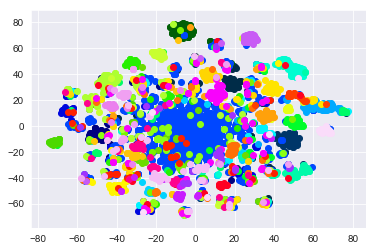

In [0]:
for i in range(39):
    X = X_trans[km_plot[39].labels_==i]
    plt.scatter(X[:,0], X[:,1], color=plt.cm.gist_ncar(i/39))

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

vect_genre = CountVectorizer()
X_genre = vect_genre.fit_transform(df.genres.str.replace(" ", "").str.replace("-", ""))
print(vect_genre.vocabulary_)

{'action': 0, 'adventure': 1, 'fantasy': 9, 'scifi': 20, 'thriller': 23, 'documentary': 6, 'romance': 19, 'animation': 2, 'comedy': 4, 'family': 8, 'musical': 15, 'mystery': 16, 'western': 25, 'drama': 7, 'history': 12, 'sport': 22, 'crime': 5, 'horror': 13, 'war': 24, 'biography': 3, 'music': 14, 'gameshow': 11, 'realitytv': 18, 'news': 17, 'short': 21, 'filmnoir': 10}


In [0]:
from sklearn.cluster import KMeans

km_genre = {}
inertia_genre = []
silhouette_score_genre = []

K = range(1,81)

for k in K:
    km_genre[k] = KMeans(k)
    km_genre[k] = km_genre[k].fit(X_genre)
    inertia_genre.append(km_genre[k].inertia_)
    if k==1:
        silhouette_score_genre.append(0)
    else:
        silhouette_score_genre.append(silhouette_score(X_genre, km_genre[k].labels_))

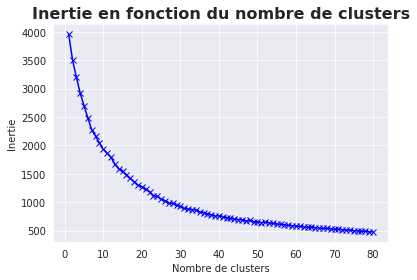

In [0]:
import matplotlib.pyplot as plt
plt.plot(K, inertia_genre, 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Inertie')
plt.title('Inertie en fonction du nombre de clusters', fontdict={'fontweight': 'bold', 'fontsize': 16})
plt.show()

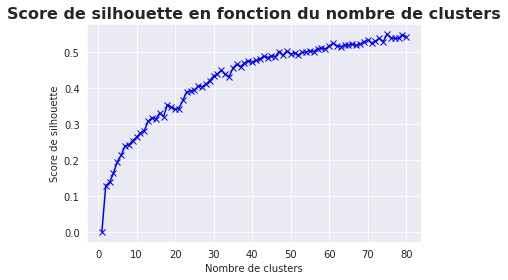

In [0]:
plt.plot(K, silhouette_score_genre, 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette en fonction du nombre de clusters', fontdict={'fontweight': 'bold', 'fontsize': 16})
plt.show()

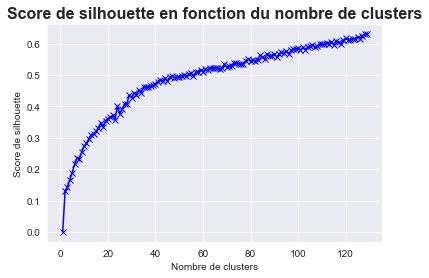

In [0]:
K_bis = range(81, 130)
for k in K_bis:
    km_genre[k] = KMeans(k)
    km_genre[k] = km_genre[k].fit(X_genre)
    inertia_genre.append(km_genre[k].inertia_)
    if k==1:
        silhouette_score_genre.append(0)
    else:
        silhouette_score_genre.append(silhouette_score(X_genre, km_genre[k].labels_))
        
plt.plot(range(1, 130), silhouette_score_genre, 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette en fonction du nombre de clusters', fontdict={'fontweight': 'bold', 'fontsize': 16})
plt.show()

Risque d'overfit avec un nombre de clusters trop élevé, sachant qu'on a moins de 5000 films dans la base corrigée.

In [0]:
from sklearn.cluster import KMeans

km_genre = {}
km_genre[39] = KMeans(39, n_init=200)
km_genre[39] = km_genre[39].fit(X_genre)

Regardons avec 129 clusters quels films sont regroupés

In [0]:
df[df.movie_title.str.contains("Star Wars")][['movie_title', 'genres', 'shared_plot_keywords']]

,movie_title,genres,shared_plot_keywords
4,Star Wars: Episode VII - The Force Awakens,Documentary,
236,Star Wars: Episode III - Revenge of the Sith,Action|Adventure|Fantasy|Sci-Fi,vision
237,Star Wars: Episode II - Attack of the Clones,Action|Adventure|Fantasy|Sci-Fi,martial arts|prequel
240,Star Wars: Episode I - The Phantom Menace,Action|Adventure|Fantasy|Sci-Fi,alien|hand to hand combat|seven word title|wil...
1536,Star Wars: Episode VI - Return of the Jedi,Action|Adventure|Fantasy|Sci-Fi,death star|emperor|empire|princess|rebel
2051,Star Wars: Episode V - The Empire Strikes Back,Action|Adventure|Fantasy|Sci-Fi,duel|rebel|rescue
3024,Star Wars: Episode IV - A New Hope,Action|Adventure|Fantasy|Sci-Fi,death star|empire|princess|rebellion
3329,Star Wars: The Clone Wars,Action|Adventure|Animation|Drama|Fantasy|Sci-Fi,female warrior


In [0]:
star_wars_old_idx = df[df.movie_title.str.contains("Star Wars")].index
star_wars_new_idx = df.reset_index()[df.reset_index().movie_title.str.contains("Star Wars")].index
star_wars_new_idx

Int64Index([4, 233, 234, 237, 1521, 2031, 2974, 3273], dtype='int64')

In [0]:
km_genre[129] = KMeans(129)
km_genre[129] = km_genre[129].fit(X_genre)
km_genre[129].labels_[star_wars_idx]

array([ 26,  10, 105,  16,  65,  18,  11,  21], dtype=int32)

Les films Star Wars sont dans des clusters différents

In [0]:
km_genre[39].labels_[star_wars_new_idx]

array([18, 26, 26, 26, 26, 26, 26, 26], dtype=int32)

In [0]:
df[df.movie_title.str.lower().str.contains("avenger")][['director_name', 'movie_title', 'genres', 'shared_plot_keywords']]

,director_name,movie_title,genres,shared_plot_keywords
8,Joss Whedon,Avengers: Age of Ultron,Action|Adventure|Sci-Fi,artificial intelligence|based on comic book|ca...
17,Joss Whedon,The Avengers,Action|Adventure|Sci-Fi,alien invasion|assassin|battle|iron man|soldier
171,Joe Johnston,Captain America: The First Avenger,Action|Adventure|Sci-Fi,arctic|captain america|scientist
4248,Michael Herz,The Toxic Avenger Part II,Action|Comedy|Horror|Sci-Fi,bare breasts|japan|tokyo japan|troma
4779,Michael Herz,The Toxic Avenger,Action|Comedy|Horror|Sci-Fi,boy|superhero|toxic waste|troma


In [0]:
marvel_directors =[
    "Joss Whedon",
    "Joe Johnston",
    "Jon Favreau",
    "Anthony Russo",
    "Louis Leterrier",
    "Kenneth Branagh",
    "Shane Black",
    "Alan Taylor",
    "James Gunn",
    "Peyton Reed",
    "Scott Derrickson",
]

In [0]:
df.title_year.max()

2016.0

In [0]:
df[(df.director_name.isin(marvel_directors)) & (df.title_year >= 2008)][['director_name', 'movie_title', 'genres', 'shared_plot_keywords']]

,director_name,movie_title,genres,shared_plot_keywords
8,Joss Whedon,Avengers: Age of Ultron,Action|Adventure|Sci-Fi,artificial intelligence|based on comic book|ca...
17,Joss Whedon,The Avengers,Action|Adventure|Sci-Fi,alien invasion|assassin|battle|iron man|soldier
27,Anthony Russo,Captain America: Civil War,Action|Adventure|Sci-Fi,based on comic book|knife|marvel cinematic uni...
32,Shane Black,Iron Man 3,Action|Adventure|Sci-Fi,armor|explosion|terrorist
69,Jon Favreau,Iron Man,Action|Adventure|Sci-Fi,afghanistan|billionaire|inventor|playboy|u.s. ...
79,Jon Favreau,The Jungle Book,Adventure|Drama|Family|Fantasy,fire|jungle|remake|tiger|wolf
80,Jon Favreau,Iron Man 2,Action|Adventure|Sci-Fi,military|monaco|revenge
86,Anthony Russo,Captain America: The Winter Soldier,Action|Adventure|Sci-Fi,conspiracy|megalomaniac|super soldier
95,James Gunn,Guardians of the Galaxy,Action|Adventure|Sci-Fi,bounty hunter|outer space|raccoon|talking anim...
109,Alan Taylor,Terminator Genisys,Action|Adventure|Sci-Fi,alternate timeline|cyborg|future|robot|time ma...


In [0]:
for movie in df[(df.director_name.isin(marvel_directors)) & (df.title_year >= 2008)]['movie_title']:
  print('"'+movie+'",')

"Avengers: Age of Ultron",
"The Avengers",
"Captain America: Civil War",
"Iron Man 3",
"Iron Man",
"The Jungle Book",
"Iron Man 2",
"Captain America: The Winter Soldier",
"Guardians of the Galaxy",
"Terminator Genisys",
"Thor: The Dark World",
"Thor",
"The Wolfman",
"Captain America: The First Avenger",
"The Incredible Hulk",
"Ant-Man",
"Clash of the Titans",
"Cinderella",
"The Day the Earth Stood Still",
"Now You See Me",
"Jack Ryan: Shadow Recruit",
"Yes Man",
"Deliver Us from Evil",
"Sinister",
"Super",


In [0]:
marvel_movies = [
    "Avengers: Age of Ultron",
    "The Avengers",
    "Captain America: Civil War",
    "Iron Man 3",
    "Iron Man",
    "Iron Man 2",
    "Captain America: The Winter Soldier",
    "Guardians of the Galaxy",
    "Thor: The Dark World",
    "Thor",
    "Captain America: The First Avenger",
    "The Incredible Hulk",
    "Ant-Man",
]

In [0]:
marvel_old_ix = df[df.movie_title.isin(marvel_movies)].index
marvel_new_idx = df.reset_index()[df.reset_index().movie_title.isin(marvel_movies)].index

In [0]:
km_genre[39].labels_[marvel_new_idx]

array([10, 10, 10, 10, 10, 10, 10, 10, 26, 26, 10, 10, 10], dtype=int32)

In [0]:
km_plot[39].labels_[marvel_new_idx]

NameError: ignored

In [0]:
sw_genre_labels = np.unique(km_genre[39].labels_[star_wars_idx])
sw_associated_genres = df
sw_associated_genres['label'] = km_genre[39].labels_
sw_associated_genres = sw_associated_genres[sw_associated_genres['label'].isin(sw_genre_labels)][['label', 'genres']]
sw_associated_genres.sample(5)

,label,genres
1056,9,Drama|Romance|War
57,5,Action|Adventure|Sci-Fi|Thriller
2297,11,Action|Comedy|Crime
224,33,Action|Fantasy|Thriller
4824,36,Comedy|Romance


In [0]:
for i in sw_genre_labels:
  print(i, (sw_associated_genres['label']==i).sum())
  display(sw_associated_genres[sw_associated_genres['label']==i]['genres'].value_counts()[:5])

0 233


Drama    233
Name: genres, dtype: int64

5 160


Action|Adventure|Sci-Fi                  48
Action|Adventure|Sci-Fi|Thriller         34
Adventure|Comedy|Sci-Fi                  11
Action|Adventure|Comedy|Family|Sci-Fi     8
Adventure|Sci-Fi|Thriller                 7
Name: genres, dtype: int64

9 117


Drama|War                      23
Drama|Romance|War              14
Action|Drama|War               10
Action|Drama|Thriller|War       7
Adventure|Drama|Romance|War     5
Name: genres, dtype: int64

11 63


Action|Comedy|Crime              30
Action|Comedy                    15
Action|Adventure|Comedy|Crime     6
Action|Crime                      4
Action|Comedy|Crime|Drama         2
Name: genres, dtype: int64

14 85


Western                     12
Drama|Western                7
Drama|Romance|Western        7
Action|Adventure|Western     6
Comedy|Western               4
Name: genres, dtype: int64

27 115


Documentary           51
Documentary|Music     10
Comedy|Documentary     7
Documentary|Sport      5
Documentary|War        4
Name: genres, dtype: int64

33 120


Action|Adventure|Fantasy                    29
Action|Adventure|Fantasy|Sci-Fi             13
Action|Adventure|Fantasy|Sci-Fi|Thriller    12
Adventure|Fantasy                            8
Action|Adventure|Fantasy|Thriller            6
Name: genres, dtype: int64

36 172


Comedy|Romance             157
Action|Comedy|Romance        6
Comedy|Romance|Sci-Fi        5
Comedy|Romance|Thriller      2
Comedy|Mystery|Romance       2
Name: genres, dtype: int64

In [0]:
dbscan = DBSCAN(eps=.5, min_samples=10, metric='manhattan')
clus_dbscan = dbscan.fit_predict(X_genre / X_genre.sum(axis=1))
display(dbscan.labels_[star_wars_new_idx])
display(dbscan.labels_[marvel_new_idx])
display(len(np.unique(dbscan.labels_)))
display(pd.value_counts(clus_dbscan)[:5])

array([2, 0, 0, 0, 0, 0, 0, 0])

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

42

 0     2908
 22     233
-1      223
 12     205
 17     189
dtype: int64

In [0]:
X_genre / X_genre.sum(axis=1)

matrix([[0.25      , 0.25      , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.33333333, 0.33333333, 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.33333333, 0.33333333, 0.        , ..., 0.33333333, 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.33333333, 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]])

In [0]:
X_genre[star_wars_idx].toarray()

array([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0],
       [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
        0, 1, 0, 0],
       [1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
        0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0]], dtype=int64)

In [0]:
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import pdist

X_genre_sw = X_genre[star_wars_idx]
sw_genre_dist = pairwise_distances(X_genre_sw)

# skip diagonal from the calculation of the mean, as it bias the value downwards for small number of values
np.fill_diagonal(sw_genre_dist, np.NaN)
print("Star Wars mean genre euclidian distance:", np.nanmean(sw_genre_dist))

global_genre_dist = pdist(X_genre.toarray())
print("Global mean genre euclidian distance:", global_genre_dist.mean())

del X_genre_sw
del sw_genre_dist
del global_genre_dist

Star Wars mean genre euclidian distance: 1.3263535211602009
Global mean genre euclidian distance: 1.2448836195636428


In [0]:
X_plot_sw = X_plot[star_wars_idx]
sw_plot_dist = pairwise_distances(X_plot_sw)

# skip diagonal from the calculation of the mean, as it bias the value downwards for small number of values
np.fill_diagonal(sw_plot_dist, np.NaN)
print("Star Wars mean plot euclidian distance:", np.nanmean(sw_plot_dist))

global_plot_dist = pdist(X_plot.toarray())
print("Global mean plot euclidian distance:", global_plot_dist.mean())

Star Wars mean plot euclidian distance: 1.1861858369855867
Global mean plot euclidian distance: 1.3802199282133716


In [0]:
print(global_genre_dist.shape, 5000**2)

(12095821,) 25000000


### Git commit

In [0]:
!git init

Initialized empty Git repository in /content/.git/


In [0]:
!git config --global user.name "JeromeHoen"
!git config --global user.email "g-rom67@hotmail.fr"

In [0]:
from google.colab import files
files.upload()
# upload id_rsa (private key)

Saving id_rsa.pub to id_rsa.pub


{'id_rsa.pub': b'ssh-rsa AAAAB3NzaC1yc2EAAAADAQABAAACAQCjcDt6WoTh5hn9TUVqZm1uwiuRCyZRykDtjvWYOImf8wfBSlCKGF+TBJvkvOati9wxHTo8RD8XfH7r2g/HtS7e+N2fwMoBlqLzzoTMKDMWSRqceXUqKDJQlpYwLm0gms3ka7rSuLTo+3Bg1oseyZQdt4GdslG7ZIDXIRHWz/9US2R8XNddXX8ZpxnpQpC57DelEBh41GVThmz62kp2ntzonz5ED3+mJlTGMIwksXoYGalSVuJgL3zqQbpKropAZaVpYs5+mA94h4YsabBsGZLgNf+pmZbn9E+qyUBAxB5pcj9P/1cyVAevnKFG23FySwEarPfqfyZ6VHbEX2VMsh9O89zObW3qrPFT8BJb7EvrWOrYkl8IT8wGDMews8aufYTkFCnZL1vSgd8PKksrGIhEH+qXsMd/OChPdCHH4387+CsRixhPXbUTmO3nDckk61+pVuG1FNhUtvRwWjeC8Lkq2Se74wAtxKXY+wllJYmsiDbskcI8r4uM3rb3h+tD8XwL+VQ+iuhPXUIVbNNdWCOBufc5aDG+lsybkUYqqTwuSxch+cHB6hqXv+ndnoRjCn59fnT6cvOIgSxn9+7z+qsD9sHcnQgRnjmZ/QHyogzYWcRTOFD9Me94KgKUatquGkyTw79xJdwLl2G7nE6BAN16wCP4xCabI8s7ARmfKdY76Q== g-rom67@hotmail.fr\n'}

In [0]:
!chmod 700 ~/.ssh

In [0]:
!ssh-agent /bin/bash
# run:
# ssh-add ~/.ssh/id_rsa
# or: ssh-add ~/id_rsa
# ssh-add -l
# exit

bash: cannot set terminal process group (135): Inappropriate ioctl for device
bash: no job control in this shell
]0;root@87b8138c1db2: /contentroot@87b8138c1db2:/content# ssh-add ~/.ssh/id_rsa
Identity added: /root/.ssh/id_rsa (/root/.ssh/id_rsa)
]0;root@87b8138c1db2: /contentroot@87b8138c1db2:/content# ssh-add -l
4096 SHA256:yWbF6fPkqklhGU7j7WyoD72rJgaCFy7XEHlrbaxo+aw /root/.ssh/id_rsa (RSA)
]0;root@87b8138c1db2: /contentroot@87b8138c1db2:/content# 
]0;root@87b8138c1db2: /contentroot@87b8138c1db2:/content# 
]0;root@87b8138c1db2: /contentroot@87b8138c1db2:/content# 
]0;root@87b8138c1db2: /contentroot@87b8138c1db2:/content# 
]0;root@87b8138c1db2: /contentroot@87b8138c1db2:/content# 
]0;root@87b8138c1db2: /contentroot@87b8138c1db2:/content# exit


In [0]:
!eval $(ssh-agent -s)

Agent pid 1424


In [0]:
!git clone https://github.com/JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films

fatal: destination path 'OC_P3-Developpez_un_moteur_de_recommandations_de_films' already exists and is not an empty directory.


In [0]:
!git remote add origin git@github.com:JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films.git
#    !git remote set-url origin git@github.com:JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films.git

fatal: remote origin already exists.


In [0]:
import os

os.chdir("OC_P3-Developpez_un_moteur_de_recommandations_de_films")
df.to_hdf('DataFrame.h5', key='df', format='table', mode='w')

Budget_correction.ipynb  CPIAUCNS.csv  movie_metadata.csv
budgets_corrected.csv	 DataFrame.h5  Notebook_P3.ipynb


In [0]:
!git add DataFrame.h5

In [0]:
!git commit --message="Save DataFrame"

[master 2dfa10e] Save DataFrame
 1 file changed, 0 insertions(+), 0 deletions(-)


In [0]:
!git push --set-upstream origin master

Counting objects: 3, done.
Delta compression using up to 2 threads.
Compressing objects: 100% (3/3), done.
Writing objects: 100% (3/3), 1002.75 KiB | 3.87 MiB/s, done.
Total 3 (delta 1), reused 0 (delta 0)
remote: Resolving deltas: 100% (1/1), completed with 1 local object.
To github.com:JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films.git
   c459a4f..2dfa10e  master -> master
Branch 'master' set up to track remote branch 'master' from 'origin'.


In [0]:
!git push --set-upstream origin master

To github.com:JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films.git
 ! [rejected]        master -> master (non-fast-forward)
error: failed to push some refs to 'git@github.com:JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films.git'
hint: Updates were rejected because the tip of your current branch is behind
hint: its remote counterpart. Integrate the remote changes (e.g.
hint: 'git pull ...') before pushing again.
hint: See the 'Note about fast-forwards' in 'git push --help' for details.


In [0]:
# generate SSH key
# !ssh-keygen -t rsa -b 4096 -C "g-rom67@hotmail.fr"
# !ssh-keyscan -H github.com >> ~/.ssh/known_hosts

### Sauvegarde et chargement du DF

In [0]:
df.to_hdf('DataFrame.h5', key='df', format='table', mode='w')

In [0]:
!wget https://github.com/JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films/raw/master/DataFrame.h5
df = pd.read_hdf("DataFrame.h5", key='df', mode='r')

--2019-05-14 15:19:39--  https://github.com/JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films/raw/master/DataFrame.h5
Resolving github.com (github.com)... 192.30.253.113
Connecting to github.com (github.com)|192.30.253.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films/master/DataFrame.h5 [following]
--2019-05-14 15:19:39--  https://raw.githubusercontent.com/JeromeHoen/OC_P3-Developpez_un_moteur_de_recommandations_de_films/master/DataFrame.h5
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9853644 (9.4M) [application/octet-stream]
Saving to: ‘DataFrame.h5.1’

DataFrame.h5.1      100%[===================>]   9.40M  --.

In [0]:
df.head()

,movie_title,genres,title_year,director_name,actor_1_name,actor_2_name,actor_3_name,budget,budget_USD,budget_inflation_adjusted,...,num_user_for_reviews,duration,color,aspect_ratio,plot_keywords,shared_plot_keywords,content_rating,suitable_for_children,suitable_for_young_teenagers,shown_in_theaters
0,Avatar,Action|Adventure|Fantasy|Sci-Fi,2009.0,James Cameron,CCH Pounder,Joel David Moore,Wes Studi,237000000.0,237000000.0,2.651370e+08,...,3054.0,178.0,1,1.78,avatar|future|marine|native|paraplegic,avatar|future|marine,PG-13,0.0,1.0,1.0
1,Pirates of the Caribbean: At World's End,Action|Adventure|Fantasy,2007.0,Gore Verbinski,Johnny Depp,Orlando Bloom,Jack Davenport,300000000.0,300000000.0,3.472621e+08,...,1238.0,169.0,1,2.35,goddess|marriage ceremony|marriage proposal|pi...,goddess|marriage proposal|pirate|singapore,PG-13,0.0,1.0,1.0
2,Spectre,Action|Adventure|Thriller,2015.0,Sam Mendes,Christoph Waltz,Rory Kinnear,Stephanie Sigman,245000000.0,245000000.0,2.480909e+08,...,994.0,148.0,1,2.35,bomb|espionage|sequel|spy|terrorist,bomb|espionage|sequel|spy|terrorist,PG-13,0.0,1.0,1.0
3,The Dark Knight Rises,Action|Thriller,2012.0,Christopher Nolan,Tom Hardy,Christian Bale,Joseph Gordon-Levitt,250000000.0,250000000.0,2.613388e+08,...,2701.0,164.0,1,2.35,deception|imprisonment|lawlessness|police offi...,deception|imprisonment|police officer|terroris...,PG-13,0.0,1.0,1.0
4,Star Wars: Episode VII - The Force Awakens,Documentary,NaN,Doug Walker,Doug Walker,Rob Walker,NaN,NaN,NaN,NaN,...,NaN,NaN,0,NaN,NaN,,NaN,0.0,1.0,1.0
